# Import Libraries

### Description of the experiments:
 - Lambda and threshold experiments not going in the right direction. Noticed that applying the z L1 loss is not fixing the problem of bright backgrounds.
 - Incorporate new loss by calculating the L1 loss between img_stack average and latent image average
 - Network initialization method to see if it changes the random results being produced
 - Learning rate tuning performed and found that 1e-3 is probably the best for Adam optimizer
 - Added variance ordering loss. Will perform experiments evaluating performance after addition of this loss.
 - Added covariance penalty loss which should help preserve the color schemes better
 - Added experiments with covariance penalty loss to to verify that the loss is working correctly

In [1]:
! pwd

/home/arya1080/python_projects/CNN_TAM


In [2]:
# importing the libraries
import pandas as pd
import numpy as np
import os
import cv2
import re

# for reading and displaying images
from skimage import io
import matplotlib.pyplot as plt
%matplotlib inline

# for creating validation set
from sklearn.model_selection import train_test_split

# for evaluating the model
from sklearn.metrics import accuracy_score
from tqdm import tqdm

# PyTorch libraries and modules
import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import ReLU, Sigmoid, Sequential, Conv2d, Module 
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR
import torch.nn.functional as f
# torch.manual_seed(4) # different seeds will produce different color schemes in the autoencoder latent codes

# Load dataset

In [3]:
# loading dataset
data_dir = '/home/arya1080/engrprojects/WilsonGroup/TuCo/data/20210920 modify SVD_mods_Arya/620nm/'
filenames = os.listdir(data_dir)
# print(filenames)
img_stack = []
for files in filenames:
    img = io.imread(data_dir + files)
#     plt.imshow(img[:,:,5], cmap='gray')
#     plt.show()
    img_stack.append(img)

In [4]:
# convert images to numpy arrays
img_stack = np.asarray(img_stack)
img_stack = img_stack.astype('float32')
print(img_stack.shape)

(25, 681, 406, 9)


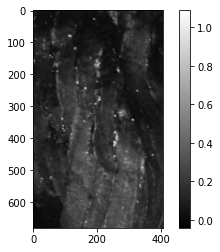

In [5]:
# choose a slice and show
plt.imshow(img_stack[2,:,:,5], cmap = 'gray')
plt.colorbar()
plt.show()

In [6]:
# get image height and width metrics
_, nx, ny, nch = img_stack.shape
print('img width = {}, img height = {}, img channels = {}'.format(nx, ny, nch))

img width = 681, img height = 406, img channels = 9


# Define model

In [7]:
class Net(Module):   
    def __init__(self):
        super(Net, self).__init__()

        self.cnn_layers = Sequential(
            # Defining a 2D convolution layer
            Conv2d(nch, 64, kernel_size=3, stride=1, padding=1),
            ReLU(inplace=True),
            
            # Defining another 2D convolution layer
            Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            ReLU(inplace=True),
            
            # Defining another 2D convolution layer
            Conv2d(64, 64, kernel_size=1, stride=1),
            ReLU(inplace=True),
            
            # Defining another 2D convolution layer
            Conv2d(64, 64, kernel_size=1, stride=1),
            ReLU(inplace=True),
            
            # Defining another 2D convolution layer
            Conv2d(64, 3, kernel_size=1, stride=1),
            Sigmoid()
        )
        
        """The spectral autoencoder has a bottleneck in the number of channels instead of upsampling and downsampling layers"""
        self.cnn_spectral_layers = Sequential(
            # Defining a 2D convolution layer
            Conv2d(3, 64, kernel_size=1, stride=1),
            ReLU(inplace=True),
            
            # Defining another 2D convolution layer
            Conv2d(64, nch, kernel_size=1, stride=1),            
            
        )

    # Defining the forward pass    
    def forward(self, x):
        x = self.cnn_layers(x)
        x = self.cnn_spectral_layers(x)
        return x
    
    # Latent space encoding output
    def forward_enc(self, x):
        z = self.cnn_layers(x)
        return z
    
    # Decoder output
    def decoder(self, z):
        y = self.cnn_spectral_layers(z)
        return y

In [8]:
# instantiate the model by calling the function
model = Net()
print(model)

Net(
  (cnn_layers): Sequential(
    (0): Conv2d(9, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
    (9): Sigmoid()
  )
  (cnn_spectral_layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 9, kernel_size=(1, 1), stride=(1, 1))
  )
)


In [9]:
def initialize_weights(m):
  if isinstance(m, nn.Conv2d):
      nn.init.orthogonal_(m.weight.data)

In [10]:
model.apply(initialize_weights)

Net(
  (cnn_layers): Sequential(
    (0): Conv2d(9, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
    (9): Sigmoid()
  )
  (cnn_spectral_layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 9, kernel_size=(1, 1), stride=(1, 1))
  )
)

In [11]:
# define loss function
criterion = nn.L1Loss()
Lr = 1e-3
# define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=Lr)

In [12]:
# set the model training device
"""cuda:0 for GPU 0, cuda:1 for GPU1, cpu for CPU"""
device = 'cuda:0'
print(device)
model.to(device) # load the model in the training device

cuda:0


Net(
  (cnn_layers): Sequential(
    (0): Conv2d(9, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
    (9): Sigmoid()
  )
  (cnn_spectral_layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 9, kernel_size=(1, 1), stride=(1, 1))
  )
)

In [13]:
# prepare the input data before training
img_stack = torch.tensor(img_stack)
print(img_stack.shape)
img_stack = img_stack.to(device)

torch.Size([25, 681, 406, 9])


In [14]:
# stack_avg = torch.mean(torch.abs(img_stack), 3)
# print(stack_avg.shape)

In [15]:
# img_arr = []
# for img in stack_avg:
#     img = img.detach().cpu().numpy()
#     img_arr.append(img)
# img_arr = np.asarray(img_arr)

# for img in img_arr:
#     print('Max value within image:',np.max(img))
#     plt.imshow(img)
#     plt.colorbar()
#     plt.show()


In [16]:
# define latent space visualization function
def visualize_z(ind):
    data = img_stack[ind,:,:,:]
    data = data[None,:]
    data = data.to(device)
    out = model.forward_enc(torch.permute(data, (0, 3, 1, 2)))
    out = out[0,:,:,:]
    out = torch.permute(out, (1,2,0))
    img = out.detach().cpu().numpy()
#     plt.figure(figsize=(10,10))
#     plt.imshow(img)
#     plt.show()
    return img

def meansq(x):
    return torch.mean(x**2)

def abs_cov(x, y):
    return torch.mean(torch.abs(x*y))/(torch.sqrt(torch.mean(x**2))*torch.sqrt(torch.mean(y**2)))

# Train model

  0%|▏                                          | 1/200 [00:00<01:10,  2.82it/s]

Epoch: 1, Total Loss : 0.295195, L1 only: 0.156929, Z Loss: 0.274781, Var Loss: 0.001281, Cov Loss: 2.599164


  1%|▍                                          | 2/200 [00:00<01:07,  2.94it/s]

Epoch: 2, Total Loss : 0.135536, L1 only: 0.073410, Z Loss: 0.153626, Var Loss: 0.000000, Cov Loss: 1.150332


  2%|▋                                          | 3/200 [00:01<01:06,  2.98it/s]

Epoch: 3, Total Loss : 0.090703, L1 only: 0.060576, Z Loss: 0.120721, Var Loss: 0.000000, Cov Loss: 0.530114


  2%|▊                                          | 4/200 [00:01<01:05,  3.00it/s]

Epoch: 4, Total Loss : 0.079457, L1 only: 0.059355, Z Loss: 0.110377, Var Loss: 0.000000, Cov Loss: 0.335808


  2%|█                                          | 5/200 [00:01<01:04,  3.01it/s]

Epoch: 5, Total Loss : 0.070214, L1 only: 0.054009, Z Loss: 0.106886, Var Loss: 0.000000, Cov Loss: 0.259975


  3%|█▎                                         | 6/200 [00:02<01:04,  3.01it/s]

Epoch: 6, Total Loss : 0.051842, L1 only: 0.042764, Z Loss: 0.065380, Var Loss: 0.000000, Cov Loss: 0.142329


  4%|█▌                                         | 7/200 [00:02<01:03,  3.02it/s]

Epoch: 7, Total Loss : 0.038358, L1 only: 0.033293, Z Loss: 0.058323, Var Loss: 0.000000, Cov Loss: 0.066306


  4%|█▋                                         | 8/200 [00:02<01:03,  3.02it/s]

Epoch: 8, Total Loss : 0.034098, L1 only: 0.030374, Z Loss: 0.056413, Var Loss: 0.000000, Cov Loss: 0.040640


  4%|█▉                                         | 9/200 [00:02<01:03,  3.02it/s]

Epoch: 9, Total Loss : 0.030940, L1 only: 0.027657, Z Loss: 0.059778, Var Loss: 0.000000, Cov Loss: 0.029807
Epoch: 10, Total Loss : 0.027446, L1 only: 0.024293, Z Loss: 0.058343, Var Loss: 0.000314, Cov Loss: 0.027738


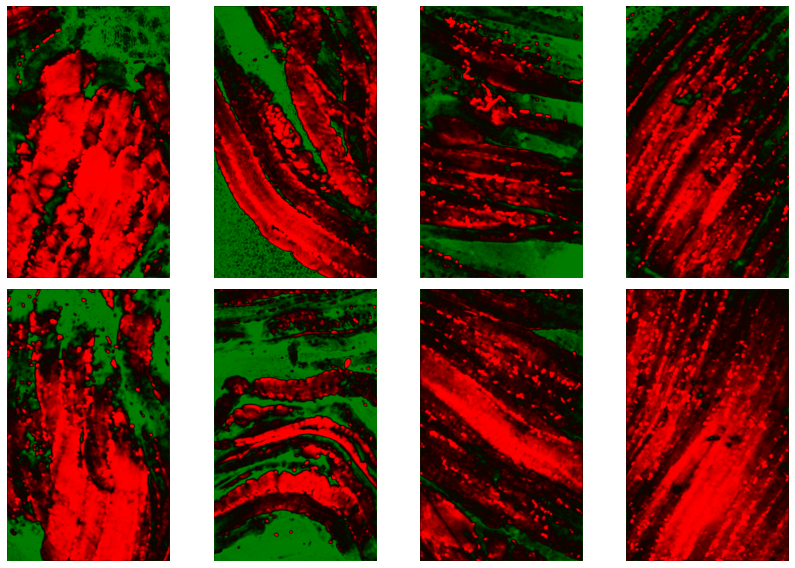

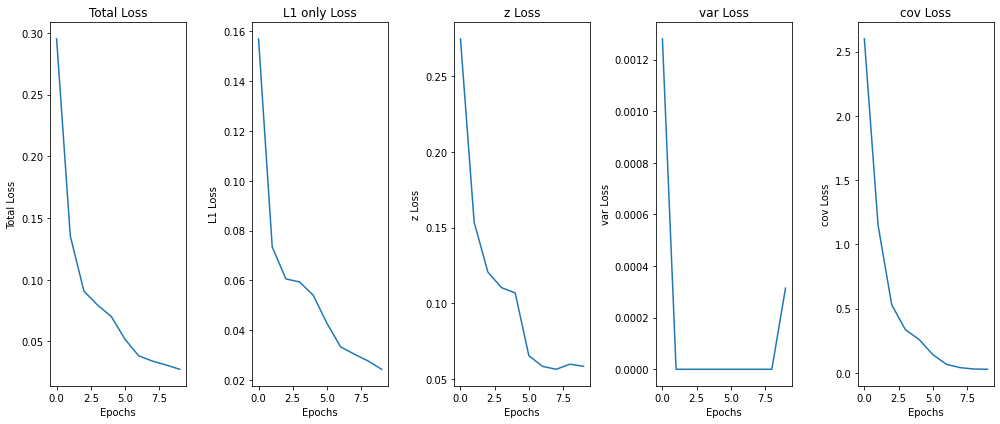

  6%|██▎                                       | 11/200 [00:04<01:36,  1.96it/s]

Epoch: 11, Total Loss : 0.028622, L1 only: 0.025435, Z Loss: 0.061162, Var Loss: 0.002555, Cov Loss: 0.024482


  6%|██▌                                       | 12/200 [00:04<01:25,  2.20it/s]

Epoch: 12, Total Loss : 0.026562, L1 only: 0.023690, Z Loss: 0.060490, Var Loss: 0.000054, Cov Loss: 0.021087


  6%|██▋                                       | 13/200 [00:05<01:18,  2.40it/s]

Epoch: 13, Total Loss : 0.025512, L1 only: 0.022777, Z Loss: 0.058455, Var Loss: 0.001534, Cov Loss: 0.018105


  7%|██▉                                       | 14/200 [00:05<01:12,  2.55it/s]

Epoch: 14, Total Loss : 0.022585, L1 only: 0.020026, Z Loss: 0.057819, Var Loss: 0.000677, Cov Loss: 0.015814


  8%|███▏                                      | 15/200 [00:05<01:09,  2.68it/s]

Epoch: 15, Total Loss : 0.021657, L1 only: 0.019142, Z Loss: 0.058302, Var Loss: 0.001476, Cov Loss: 0.013844


  8%|███▎                                      | 16/200 [00:06<01:06,  2.77it/s]

Epoch: 16, Total Loss : 0.023459, L1 only: 0.020953, Z Loss: 0.061213, Var Loss: 0.001684, Cov Loss: 0.011694


  8%|███▌                                      | 17/200 [00:06<01:04,  2.84it/s]

Epoch: 17, Total Loss : 0.026095, L1 only: 0.023630, Z Loss: 0.064337, Var Loss: 0.001485, Cov Loss: 0.009213


  9%|███▊                                      | 18/200 [00:06<01:02,  2.89it/s]

Epoch: 18, Total Loss : 0.024829, L1 only: 0.022343, Z Loss: 0.062821, Var Loss: 0.003841, Cov Loss: 0.008202


 10%|███▉                                      | 19/200 [00:07<01:01,  2.93it/s]

Epoch: 19, Total Loss : 0.020711, L1 only: 0.018320, Z Loss: 0.058501, Var Loss: 0.001431, Cov Loss: 0.011284
Epoch: 20, Total Loss : 0.019797, L1 only: 0.017516, Z Loss: 0.058867, Var Loss: 0.001621, Cov Loss: 0.008693


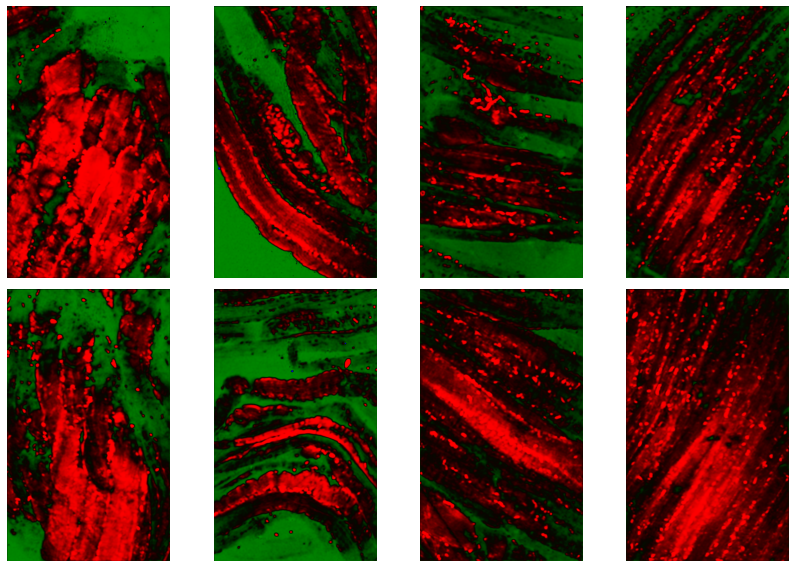

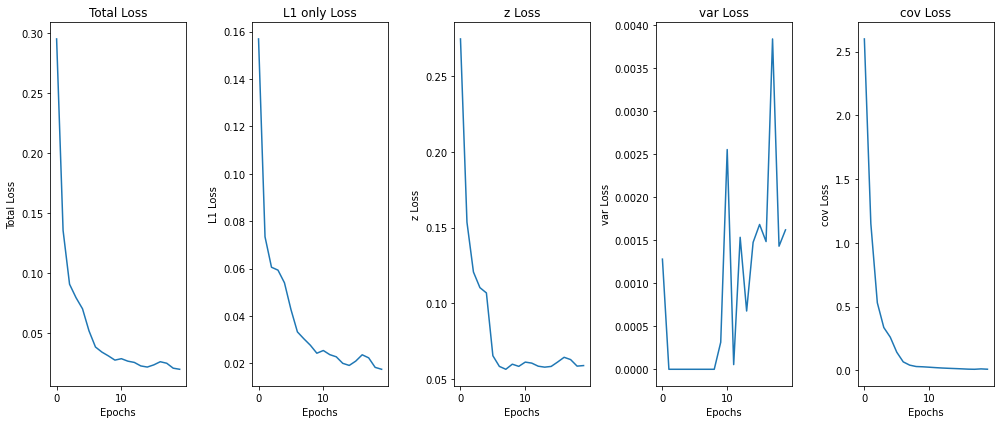

 10%|████▍                                     | 21/200 [00:08<01:32,  1.93it/s]

Epoch: 21, Total Loss : 0.019434, L1 only: 0.017209, Z Loss: 0.059933, Var Loss: 0.001099, Cov Loss: 0.007430


 11%|████▌                                     | 22/200 [00:09<01:22,  2.17it/s]

Epoch: 22, Total Loss : 0.019188, L1 only: 0.016990, Z Loss: 0.060245, Var Loss: 0.000970, Cov Loss: 0.006855


 12%|████▊                                     | 23/200 [00:09<01:14,  2.36it/s]

Epoch: 23, Total Loss : 0.019025, L1 only: 0.016875, Z Loss: 0.060638, Var Loss: 0.000713, Cov Loss: 0.005912


 12%|█████                                     | 24/200 [00:09<01:09,  2.53it/s]

Epoch: 24, Total Loss : 0.019113, L1 only: 0.016993, Z Loss: 0.060867, Var Loss: 0.000591, Cov Loss: 0.005293


 12%|█████▎                                    | 25/200 [00:09<01:05,  2.66it/s]

Epoch: 25, Total Loss : 0.018861, L1 only: 0.016763, Z Loss: 0.060885, Var Loss: 0.000256, Cov Loss: 0.005163


 13%|█████▍                                    | 26/200 [00:10<01:03,  2.76it/s]

Epoch: 26, Total Loss : 0.019222, L1 only: 0.017157, Z Loss: 0.060354, Var Loss: 0.000377, Cov Loss: 0.004696


 14%|█████▋                                    | 27/200 [00:10<01:01,  2.83it/s]

Epoch: 27, Total Loss : 0.018913, L1 only: 0.016870, Z Loss: 0.059989, Var Loss: 0.000019, Cov Loss: 0.004841


 14%|█████▉                                    | 28/200 [00:10<00:59,  2.88it/s]

Epoch: 28, Total Loss : 0.018749, L1 only: 0.016754, Z Loss: 0.058920, Var Loss: 0.000102, Cov Loss: 0.004440


 14%|██████                                    | 29/200 [00:11<00:58,  2.92it/s]

Epoch: 29, Total Loss : 0.018585, L1 only: 0.016599, Z Loss: 0.059405, Var Loss: 0.000036, Cov Loss: 0.004040
Epoch: 30, Total Loss : 0.018161, L1 only: 0.016163, Z Loss: 0.059970, Var Loss: 0.000000, Cov Loss: 0.003973


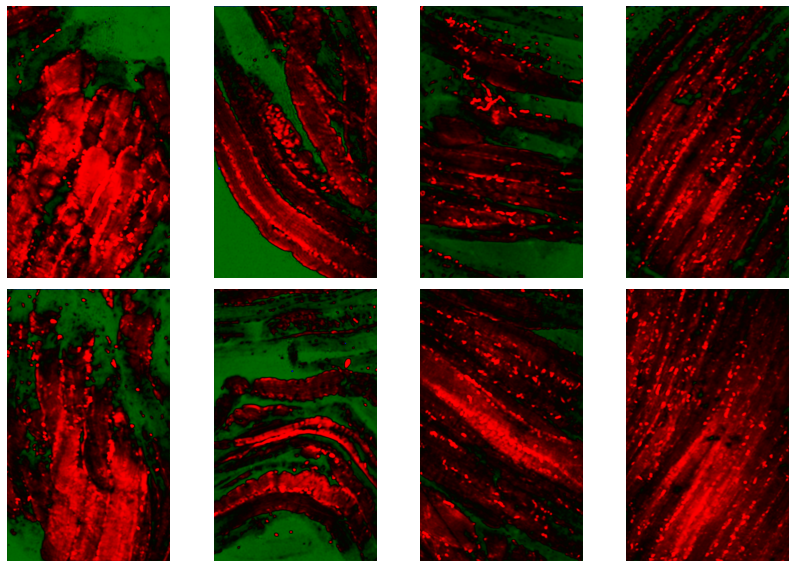

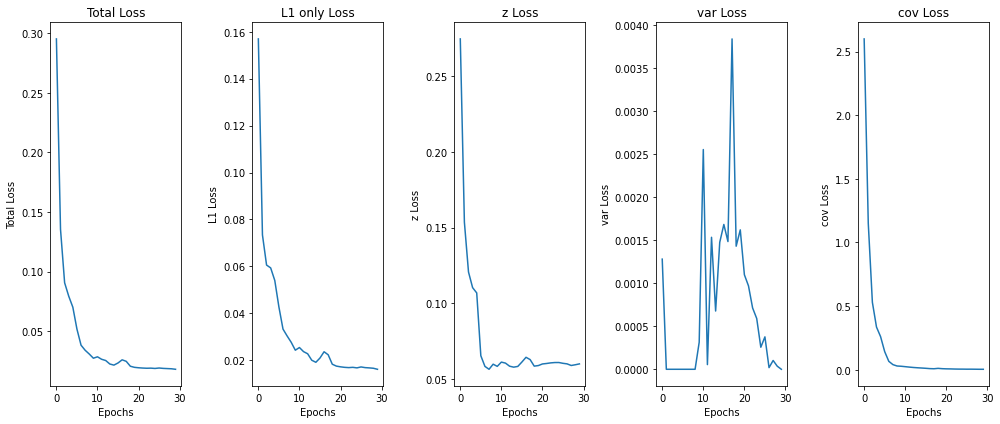

 16%|██████▌                                   | 31/200 [00:12<01:28,  1.92it/s]

Epoch: 31, Total Loss : 0.018769, L1 only: 0.016764, Z Loss: 0.060636, Var Loss: 0.000079, Cov Loss: 0.003649


 16%|██████▋                                   | 32/200 [00:13<01:18,  2.15it/s]

Epoch: 32, Total Loss : 0.018040, L1 only: 0.016031, Z Loss: 0.060688, Var Loss: 0.000000, Cov Loss: 0.003778


 16%|██████▉                                   | 33/200 [00:13<01:10,  2.35it/s]

Epoch: 33, Total Loss : 0.025185, L1 only: 0.023088, Z Loss: 0.064021, Var Loss: 0.000000, Cov Loss: 0.003525


 17%|███████▏                                  | 34/200 [00:13<01:05,  2.52it/s]

Epoch: 34, Total Loss : 0.023234, L1 only: 0.021075, Z Loss: 0.064902, Var Loss: 0.000000, Cov Loss: 0.004244


 18%|███████▎                                  | 35/200 [00:14<01:02,  2.65it/s]

Epoch: 35, Total Loss : 0.019241, L1 only: 0.017038, Z Loss: 0.065244, Var Loss: 0.001102, Cov Loss: 0.003803


 18%|███████▌                                  | 36/200 [00:14<00:59,  2.75it/s]

Epoch: 36, Total Loss : 0.018060, L1 only: 0.015854, Z Loss: 0.066922, Var Loss: 0.000245, Cov Loss: 0.003719


 18%|███████▊                                  | 37/200 [00:14<00:57,  2.82it/s]

Epoch: 37, Total Loss : 0.017788, L1 only: 0.015595, Z Loss: 0.066887, Var Loss: 0.000510, Cov Loss: 0.003215


 19%|███████▉                                  | 38/200 [00:15<00:56,  2.88it/s]

Epoch: 38, Total Loss : 0.017792, L1 only: 0.015623, Z Loss: 0.066840, Var Loss: 0.000195, Cov Loss: 0.003090


 20%|████████▏                                 | 39/200 [00:15<00:55,  2.92it/s]

Epoch: 39, Total Loss : 0.017633, L1 only: 0.015472, Z Loss: 0.066843, Var Loss: 0.000154, Cov Loss: 0.002961
Epoch: 40, Total Loss : 0.017636, L1 only: 0.015499, Z Loss: 0.066578, Var Loss: 0.000025, Cov Loss: 0.002779


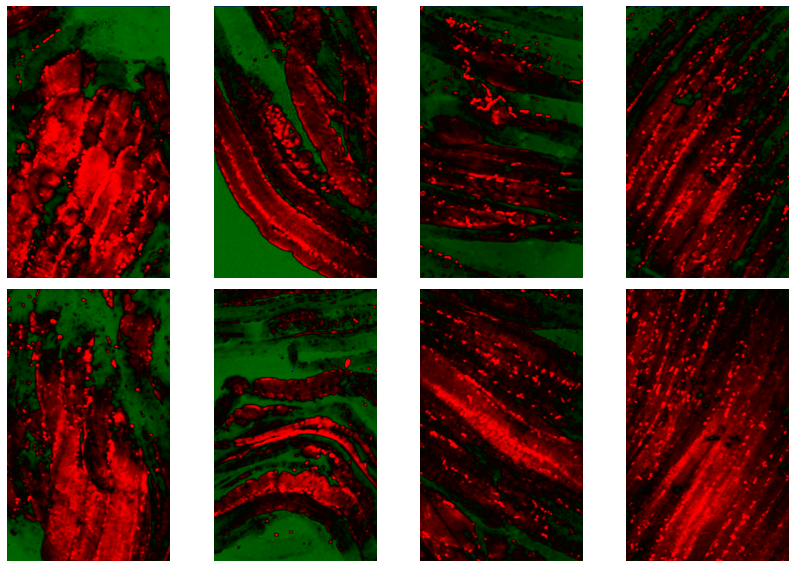

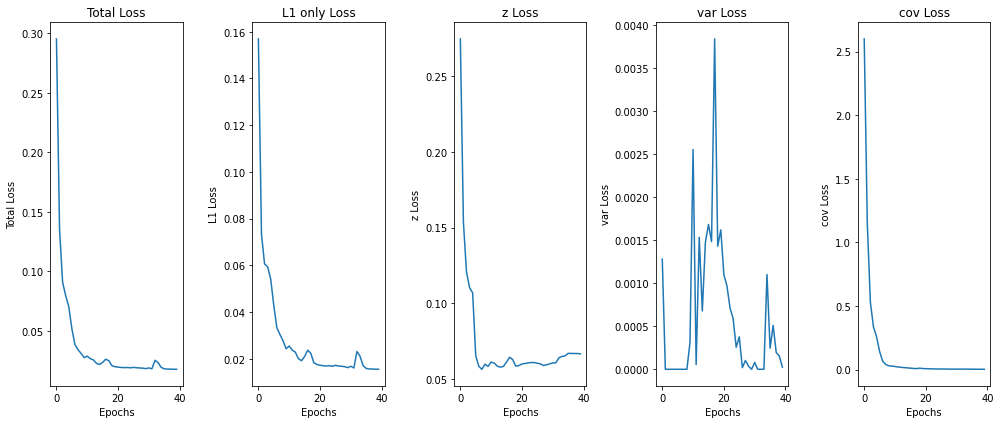

 20%|████████▌                                 | 41/200 [00:16<01:20,  1.98it/s]

Epoch: 41, Total Loss : 0.017631, L1 only: 0.015505, Z Loss: 0.066385, Var Loss: 0.000000, Cov Loss: 0.002690


 21%|████████▊                                 | 42/200 [00:17<01:11,  2.20it/s]

Epoch: 42, Total Loss : 0.017610, L1 only: 0.015478, Z Loss: 0.066735, Var Loss: 0.000000, Cov Loss: 0.002589


 22%|█████████                                 | 43/200 [00:17<01:05,  2.40it/s]

Epoch: 43, Total Loss : 0.017545, L1 only: 0.015406, Z Loss: 0.067121, Var Loss: 0.000000, Cov Loss: 0.002517


 22%|█████████▏                                | 44/200 [00:17<01:01,  2.55it/s]

Epoch: 44, Total Loss : 0.017525, L1 only: 0.015378, Z Loss: 0.067479, Var Loss: 0.000000, Cov Loss: 0.002447


 22%|█████████▍                                | 45/200 [00:18<00:57,  2.67it/s]

Epoch: 45, Total Loss : 0.017514, L1 only: 0.015363, Z Loss: 0.067738, Var Loss: 0.000000, Cov Loss: 0.002380


 23%|█████████▋                                | 46/200 [00:18<00:55,  2.77it/s]

Epoch: 46, Total Loss : 0.017534, L1 only: 0.015380, Z Loss: 0.067920, Var Loss: 0.000000, Cov Loss: 0.002326


 24%|█████████▊                                | 47/200 [00:18<00:53,  2.83it/s]

Epoch: 47, Total Loss : 0.017525, L1 only: 0.015368, Z Loss: 0.068075, Var Loss: 0.000000, Cov Loss: 0.002278


 24%|██████████                                | 48/200 [00:19<00:52,  2.89it/s]

Epoch: 48, Total Loss : 0.017525, L1 only: 0.015368, Z Loss: 0.068196, Var Loss: 0.000000, Cov Loss: 0.002227


 24%|██████████▎                               | 49/200 [00:19<00:51,  2.92it/s]

Epoch: 49, Total Loss : 0.017517, L1 only: 0.015359, Z Loss: 0.068319, Var Loss: 0.000000, Cov Loss: 0.002174
Epoch: 50, Total Loss : 0.017480, L1 only: 0.015322, Z Loss: 0.068383, Var Loss: 0.000000, Cov Loss: 0.002132


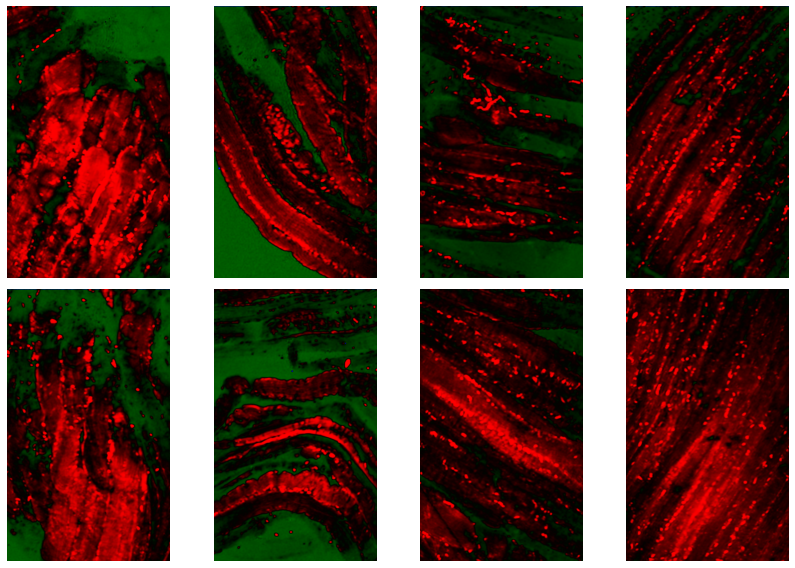

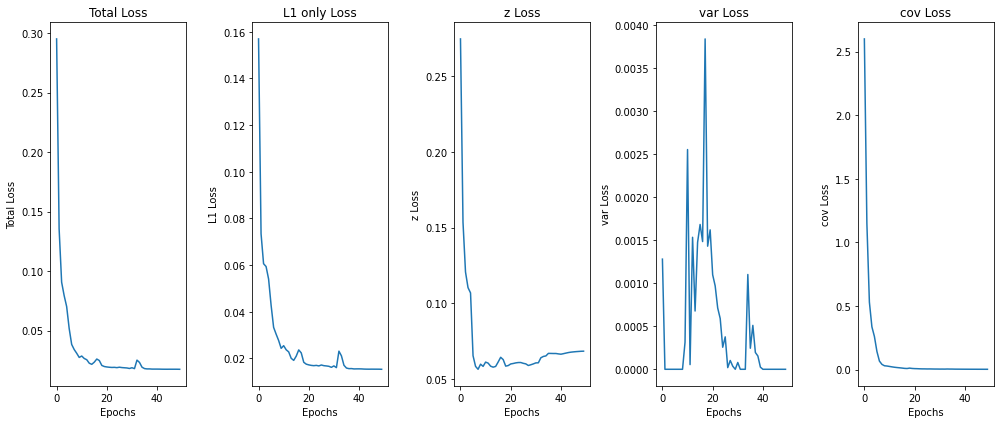

 26%|██████████▋                               | 51/200 [00:21<01:17,  1.92it/s]

Epoch: 51, Total Loss : 0.017437, L1 only: 0.015279, Z Loss: 0.068446, Var Loss: 0.000000, Cov Loss: 0.002083


 26%|██████████▉                               | 52/200 [00:21<01:08,  2.16it/s]

Epoch: 52, Total Loss : 0.017401, L1 only: 0.015246, Z Loss: 0.068422, Var Loss: 0.000000, Cov Loss: 0.002041


 26%|███████████▏                              | 53/200 [00:21<01:02,  2.36it/s]

Epoch: 53, Total Loss : 0.017360, L1 only: 0.015208, Z Loss: 0.068373, Var Loss: 0.000000, Cov Loss: 0.002010


 27%|███████████▎                              | 54/200 [00:22<00:57,  2.52it/s]

Epoch: 54, Total Loss : 0.017343, L1 only: 0.015194, Z Loss: 0.068360, Var Loss: 0.000000, Cov Loss: 0.001976


 28%|███████████▌                              | 55/200 [00:22<00:54,  2.65it/s]

Epoch: 55, Total Loss : 0.017291, L1 only: 0.015148, Z Loss: 0.068215, Var Loss: 0.000000, Cov Loss: 0.001928


 28%|███████████▊                              | 56/200 [00:22<00:52,  2.75it/s]

Epoch: 56, Total Loss : 0.017249, L1 only: 0.015114, Z Loss: 0.067992, Var Loss: 0.000000, Cov Loss: 0.001907


 28%|███████████▉                              | 57/200 [00:23<00:50,  2.82it/s]

Epoch: 57, Total Loss : 0.017197, L1 only: 0.015072, Z Loss: 0.067701, Var Loss: 0.000000, Cov Loss: 0.001875


 29%|████████████▏                             | 58/200 [00:23<00:49,  2.87it/s]

Epoch: 58, Total Loss : 0.017179, L1 only: 0.015067, Z Loss: 0.067316, Var Loss: 0.000000, Cov Loss: 0.001844


 30%|████████████▍                             | 59/200 [00:23<00:48,  2.91it/s]

Epoch: 59, Total Loss : 0.017093, L1 only: 0.014995, Z Loss: 0.066905, Var Loss: 0.000000, Cov Loss: 0.001815
Epoch: 60, Total Loss : 0.016961, L1 only: 0.014879, Z Loss: 0.066465, Var Loss: 0.000000, Cov Loss: 0.001763


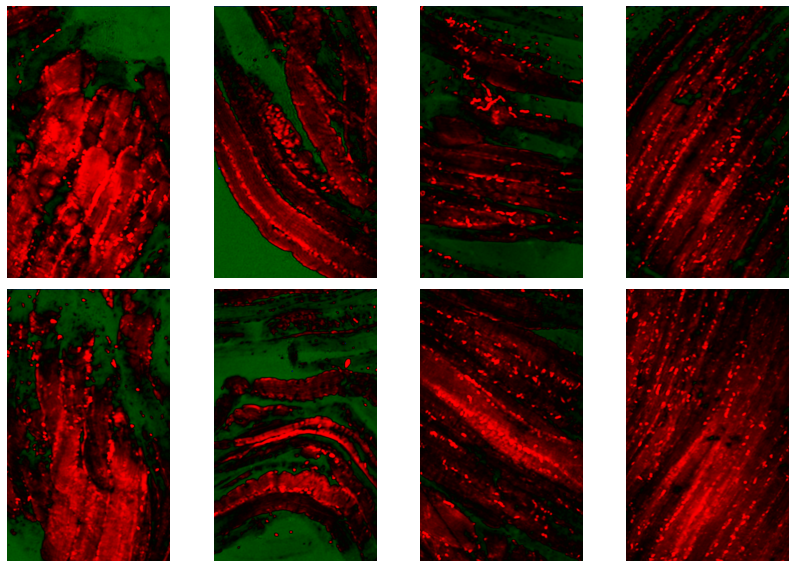

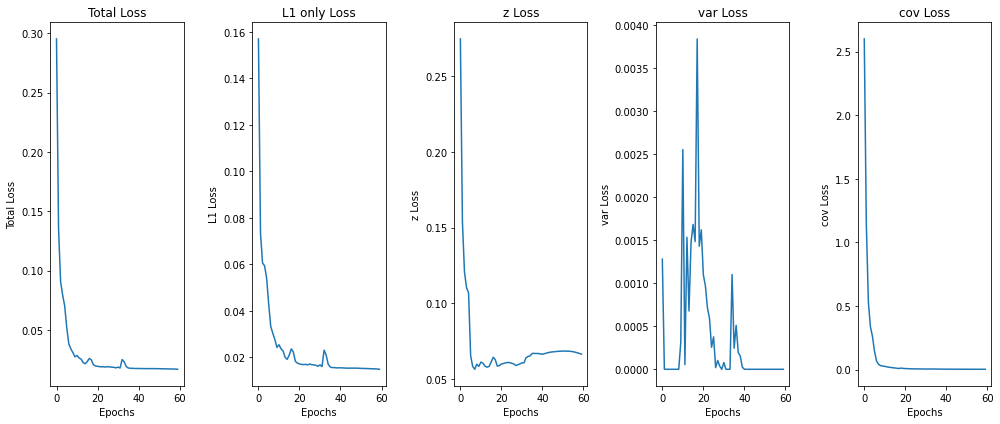

 30%|████████████▊                             | 61/200 [00:25<01:10,  1.97it/s]

Epoch: 61, Total Loss : 0.017073, L1 only: 0.015010, Z Loss: 0.065866, Var Loss: 0.000000, Cov Loss: 0.001734


 31%|█████████████                             | 62/200 [00:25<01:02,  2.20it/s]

Epoch: 62, Total Loss : 0.016733, L1 only: 0.014688, Z Loss: 0.065313, Var Loss: 0.000000, Cov Loss: 0.001708


 32%|█████████████▏                            | 63/200 [00:25<00:57,  2.39it/s]

Epoch: 63, Total Loss : 0.016763, L1 only: 0.014745, Z Loss: 0.064597, Var Loss: 0.000000, Cov Loss: 0.001612


 32%|█████████████▍                            | 64/200 [00:26<00:53,  2.54it/s]

Epoch: 64, Total Loss : 0.017256, L1 only: 0.015263, Z Loss: 0.063636, Var Loss: 0.000000, Cov Loss: 0.001681


 32%|█████████████▋                            | 65/200 [00:26<00:50,  2.67it/s]

Epoch: 65, Total Loss : 0.016843, L1 only: 0.014849, Z Loss: 0.063461, Var Loss: 0.000000, Cov Loss: 0.001806


 33%|█████████████▊                            | 66/200 [00:26<00:48,  2.76it/s]

Epoch: 66, Total Loss : 0.016918, L1 only: 0.014972, Z Loss: 0.062047, Var Loss: 0.000000, Cov Loss: 0.001691


 34%|██████████████                            | 67/200 [00:27<00:47,  2.83it/s]

Epoch: 67, Total Loss : 0.016911, L1 only: 0.014976, Z Loss: 0.061465, Var Loss: 0.000000, Cov Loss: 0.001821


 34%|██████████████▎                           | 68/200 [00:27<00:45,  2.88it/s]

Epoch: 68, Total Loss : 0.016921, L1 only: 0.015036, Z Loss: 0.059940, Var Loss: 0.000000, Cov Loss: 0.001733


 34%|██████████████▍                           | 69/200 [00:27<00:44,  2.92it/s]

Epoch: 69, Total Loss : 0.016898, L1 only: 0.015053, Z Loss: 0.058508, Var Loss: 0.000000, Cov Loss: 0.001800
Epoch: 70, Total Loss : 0.016833, L1 only: 0.015045, Z Loss: 0.056692, Var Loss: 0.000000, Cov Loss: 0.001733


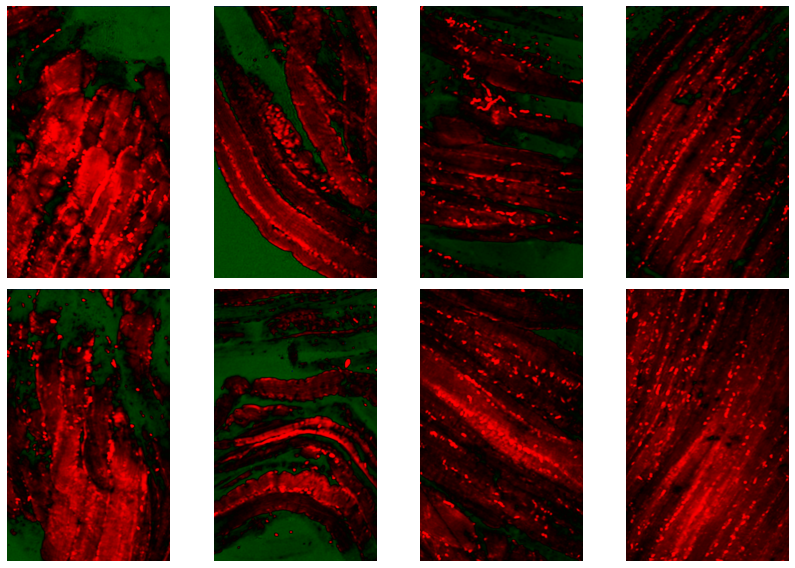

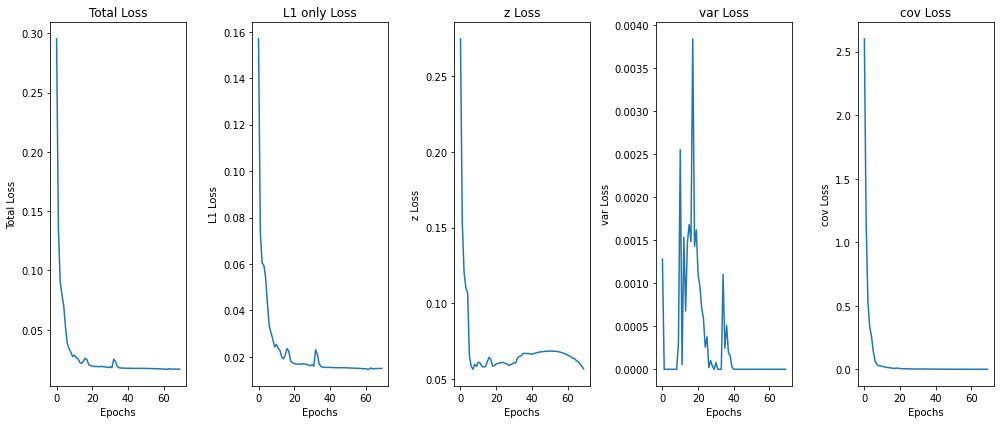

 36%|██████████████▉                           | 71/200 [00:29<01:07,  1.91it/s]

Epoch: 71, Total Loss : 0.016650, L1 only: 0.014900, Z Loss: 0.055466, Var Loss: 0.000000, Cov Loss: 0.001728


 36%|███████████████                           | 72/200 [00:29<00:59,  2.15it/s]

Epoch: 72, Total Loss : 0.021976, L1 only: 0.020194, Z Loss: 0.055696, Var Loss: 0.000000, Cov Loss: 0.002225


 36%|███████████████▎                          | 73/200 [00:30<00:54,  2.35it/s]

Epoch: 73, Total Loss : 0.020029, L1 only: 0.018199, Z Loss: 0.053371, Var Loss: 0.000000, Cov Loss: 0.004562


 37%|███████████████▌                          | 74/200 [00:30<00:50,  2.51it/s]

Epoch: 74, Total Loss : 0.017413, L1 only: 0.015608, Z Loss: 0.055733, Var Loss: 0.000000, Cov Loss: 0.002646


 38%|███████████████▊                          | 75/200 [00:30<00:47,  2.64it/s]

Epoch: 75, Total Loss : 0.016736, L1 only: 0.014978, Z Loss: 0.054394, Var Loss: 0.000000, Cov Loss: 0.002521


 38%|███████████████▉                          | 76/200 [00:31<00:45,  2.74it/s]

Epoch: 76, Total Loss : 0.016213, L1 only: 0.014502, Z Loss: 0.054058, Var Loss: 0.000000, Cov Loss: 0.001790


 38%|████████████████▏                         | 77/200 [00:31<00:43,  2.81it/s]

Epoch: 77, Total Loss : 0.016222, L1 only: 0.014562, Z Loss: 0.052929, Var Loss: 0.000000, Cov Loss: 0.001435


 39%|████████████████▍                         | 78/200 [00:31<00:42,  2.87it/s]

Epoch: 78, Total Loss : 0.016189, L1 only: 0.014576, Z Loss: 0.051517, Var Loss: 0.000000, Cov Loss: 0.001344


 40%|████████████████▌                         | 79/200 [00:32<00:41,  2.90it/s]

Epoch: 79, Total Loss : 0.016205, L1 only: 0.014646, Z Loss: 0.049732, Var Loss: 0.000000, Cov Loss: 0.001333
Epoch: 80, Total Loss : 0.016136, L1 only: 0.014633, Z Loss: 0.047857, Var Loss: 0.000000, Cov Loss: 0.001346


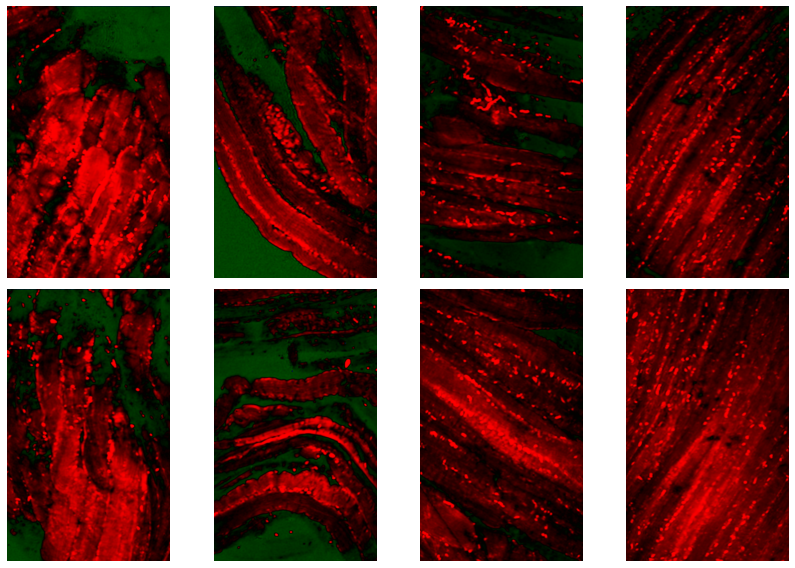

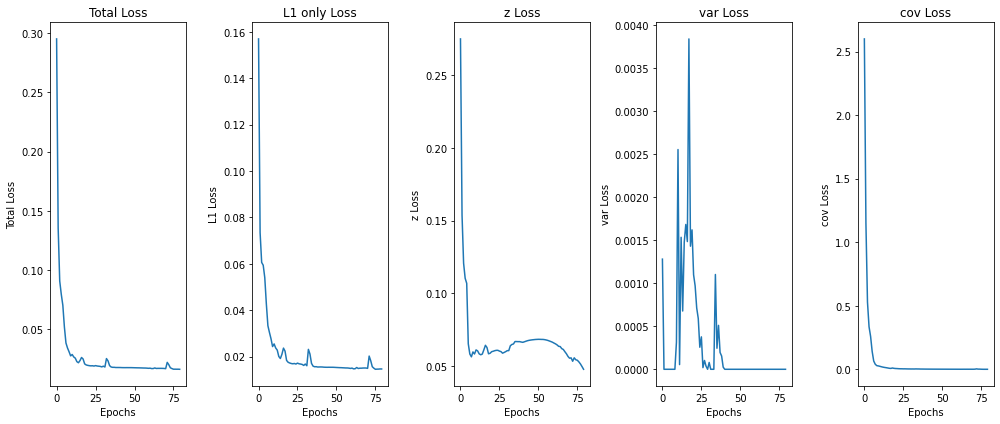

 40%|█████████████████                         | 81/200 [00:33<01:01,  1.92it/s]

Epoch: 81, Total Loss : 0.016036, L1 only: 0.014584, Z Loss: 0.046216, Var Loss: 0.000000, Cov Loss: 0.001307


 41%|█████████████████▏                        | 82/200 [00:34<00:54,  2.15it/s]

Epoch: 82, Total Loss : 0.015963, L1 only: 0.014556, Z Loss: 0.044822, Var Loss: 0.000000, Cov Loss: 0.001249


 42%|█████████████████▍                        | 83/200 [00:34<00:49,  2.35it/s]

Epoch: 83, Total Loss : 0.015999, L1 only: 0.014634, Z Loss: 0.043397, Var Loss: 0.000000, Cov Loss: 0.001256


 42%|█████████████████▋                        | 84/200 [00:34<00:46,  2.51it/s]

Epoch: 84, Total Loss : 0.016103, L1 only: 0.014776, Z Loss: 0.041909, Var Loss: 0.000000, Cov Loss: 0.001385


 42%|█████████████████▊                        | 85/200 [00:35<00:43,  2.64it/s]

Epoch: 85, Total Loss : 0.015759, L1 only: 0.014471, Z Loss: 0.040596, Var Loss: 0.000000, Cov Loss: 0.001409


 43%|██████████████████                        | 86/200 [00:35<00:41,  2.74it/s]

Epoch: 86, Total Loss : 0.016058, L1 only: 0.014809, Z Loss: 0.039386, Var Loss: 0.000000, Cov Loss: 0.001345


 44%|██████████████████▎                       | 87/200 [00:35<00:40,  2.81it/s]

Epoch: 87, Total Loss : 0.016062, L1 only: 0.014840, Z Loss: 0.037719, Var Loss: 0.000000, Cov Loss: 0.001819


 44%|██████████████████▍                       | 88/200 [00:36<00:39,  2.87it/s]

Epoch: 88, Total Loss : 0.015811, L1 only: 0.014613, Z Loss: 0.037174, Var Loss: 0.000000, Cov Loss: 0.001637


 44%|██████████████████▋                       | 89/200 [00:36<00:38,  2.91it/s]

Epoch: 89, Total Loss : 0.016052, L1 only: 0.014901, Z Loss: 0.035524, Var Loss: 0.000000, Cov Loss: 0.001706
Epoch: 90, Total Loss : 0.016037, L1 only: 0.014889, Z Loss: 0.034962, Var Loss: 0.000000, Cov Loss: 0.001978


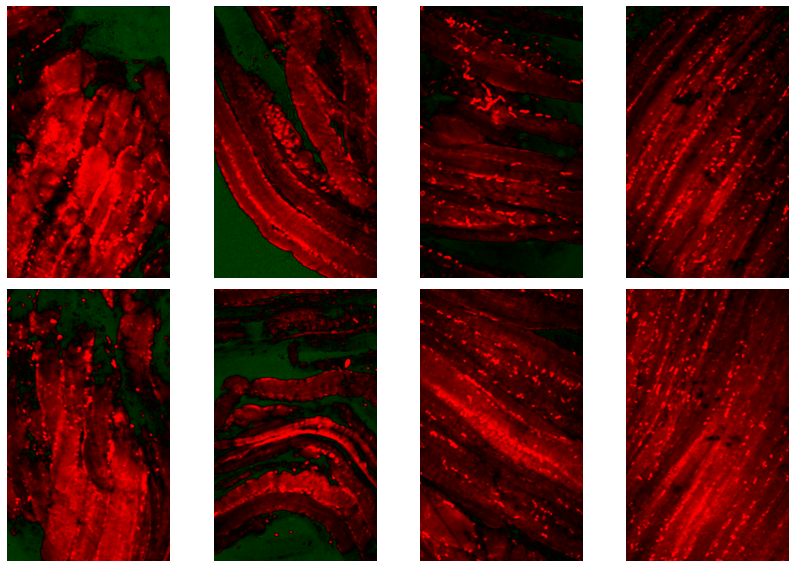

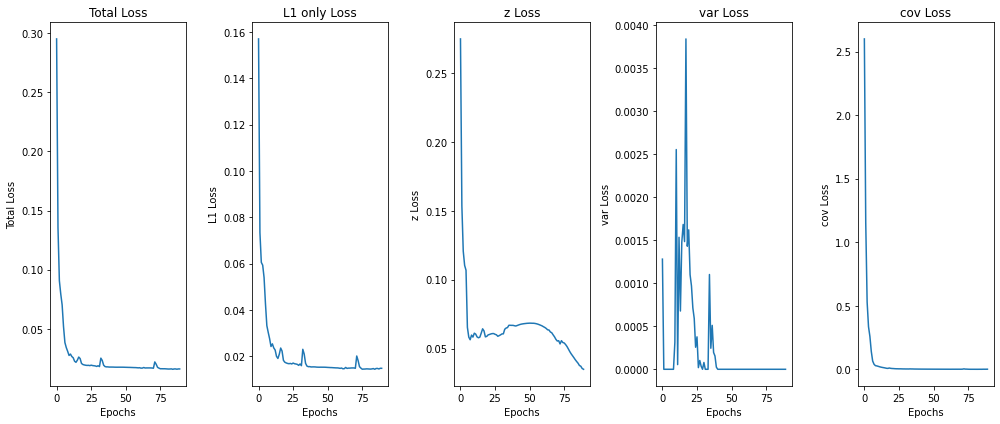

 46%|███████████████████                       | 91/200 [00:37<00:55,  1.96it/s]

Epoch: 91, Total Loss : 0.015527, L1 only: 0.014430, Z Loss: 0.033605, Var Loss: 0.000000, Cov Loss: 0.001786


 46%|███████████████████▎                      | 92/200 [00:38<00:49,  2.19it/s]

Epoch: 92, Total Loss : 0.015619, L1 only: 0.014570, Z Loss: 0.032465, Var Loss: 0.000000, Cov Loss: 0.001496


 46%|███████████████████▌                      | 93/200 [00:38<00:44,  2.38it/s]

Epoch: 93, Total Loss : 0.015841, L1 only: 0.014829, Z Loss: 0.031009, Var Loss: 0.000000, Cov Loss: 0.001637


 47%|███████████████████▋                      | 94/200 [00:38<00:41,  2.54it/s]

Epoch: 94, Total Loss : 0.015562, L1 only: 0.014569, Z Loss: 0.030129, Var Loss: 0.000000, Cov Loss: 0.001780


 48%|███████████████████▉                      | 95/200 [00:39<00:39,  2.66it/s]

Epoch: 95, Total Loss : 0.015839, L1 only: 0.014891, Z Loss: 0.028641, Var Loss: 0.000000, Cov Loss: 0.001781


 48%|████████████████████▏                     | 96/200 [00:39<00:37,  2.75it/s]

Epoch: 96, Total Loss : 0.015863, L1 only: 0.014909, Z Loss: 0.028385, Var Loss: 0.000000, Cov Loss: 0.002036


 48%|████████████████████▎                     | 97/200 [00:39<00:36,  2.82it/s]

Epoch: 97, Total Loss : 0.015243, L1 only: 0.014333, Z Loss: 0.027264, Var Loss: 0.000000, Cov Loss: 0.001843


 49%|████████████████████▌                     | 98/200 [00:40<00:35,  2.87it/s]

Epoch: 98, Total Loss : 0.015683, L1 only: 0.014822, Z Loss: 0.026116, Var Loss: 0.000000, Cov Loss: 0.001551


 50%|████████████████████▊                     | 99/200 [00:40<00:34,  2.91it/s]

Epoch: 99, Total Loss : 0.015278, L1 only: 0.014436, Z Loss: 0.025080, Var Loss: 0.000000, Cov Loss: 0.001792
Epoch: 100, Total Loss : 0.015450, L1 only: 0.014645, Z Loss: 0.024064, Var Loss: 0.000000, Cov Loss: 0.001665


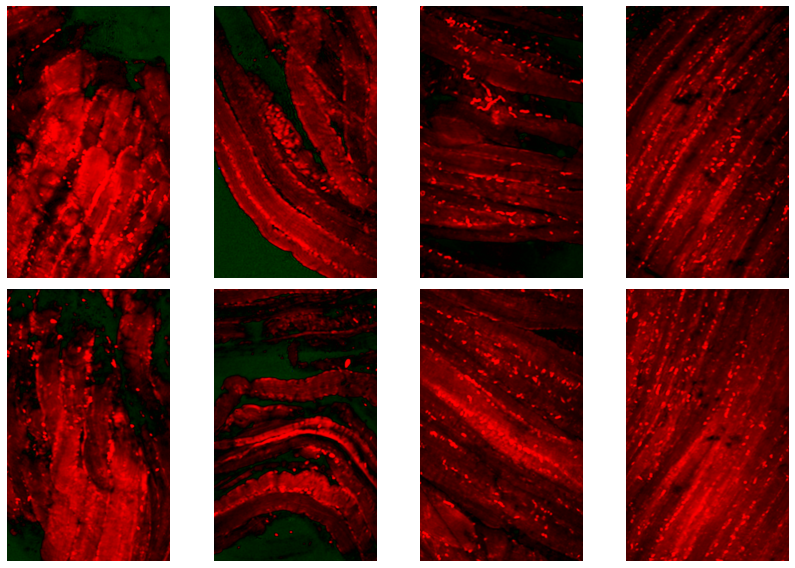

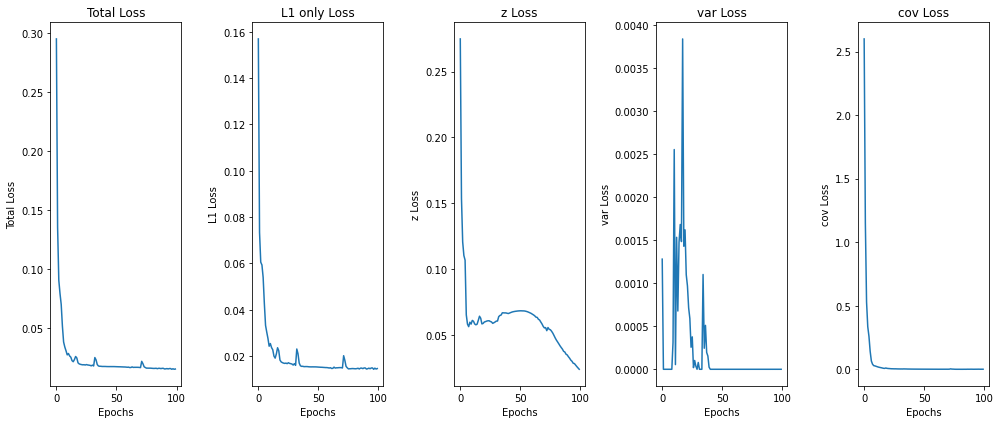

 50%|████████████████████▋                    | 101/200 [00:42<00:51,  1.92it/s]

Epoch: 101, Total Loss : 0.015321, L1 only: 0.014536, Z Loss: 0.023172, Var Loss: 0.000000, Cov Loss: 0.001784


 51%|████████████████████▉                    | 102/200 [00:42<00:45,  2.16it/s]

Epoch: 102, Total Loss : 0.015080, L1 only: 0.014328, Z Loss: 0.022338, Var Loss: 0.000000, Cov Loss: 0.001640


 52%|█████████████████████                    | 103/200 [00:42<00:41,  2.35it/s]

Epoch: 103, Total Loss : 0.018491, L1 only: 0.017635, Z Loss: 0.023998, Var Loss: 0.000000, Cov Loss: 0.002719


 52%|█████████████████████▎                   | 104/200 [00:43<00:38,  2.51it/s]

Epoch: 104, Total Loss : 0.016303, L1 only: 0.015374, Z Loss: 0.022740, Var Loss: 0.000000, Cov Loss: 0.004942


 52%|█████████████████████▌                   | 105/200 [00:43<00:35,  2.64it/s]

Epoch: 105, Total Loss : 0.015327, L1 only: 0.014557, Z Loss: 0.023277, Var Loss: 0.000000, Cov Loss: 0.001434


 53%|█████████████████████▋                   | 106/200 [00:43<00:34,  2.74it/s]

Epoch: 106, Total Loss : 0.015090, L1 only: 0.014358, Z Loss: 0.021713, Var Loss: 0.000000, Cov Loss: 0.001608


 54%|█████████████████████▉                   | 107/200 [00:44<00:33,  2.81it/s]

Epoch: 107, Total Loss : 0.015005, L1 only: 0.014313, Z Loss: 0.020558, Var Loss: 0.000000, Cov Loss: 0.001507


 54%|██████████████████████▏                  | 108/200 [00:44<00:32,  2.87it/s]

Epoch: 108, Total Loss : 0.015309, L1 only: 0.014626, Z Loss: 0.019968, Var Loss: 0.000000, Cov Loss: 0.001685


 55%|██████████████████████▎                  | 109/200 [00:44<00:31,  2.90it/s]

Epoch: 109, Total Loss : 0.014941, L1 only: 0.014290, Z Loss: 0.018810, Var Loss: 0.000000, Cov Loss: 0.001740
Epoch: 110, Total Loss : 0.015849, L1 only: 0.015184, Z Loss: 0.018776, Var Loss: 0.000000, Cov Loss: 0.002048


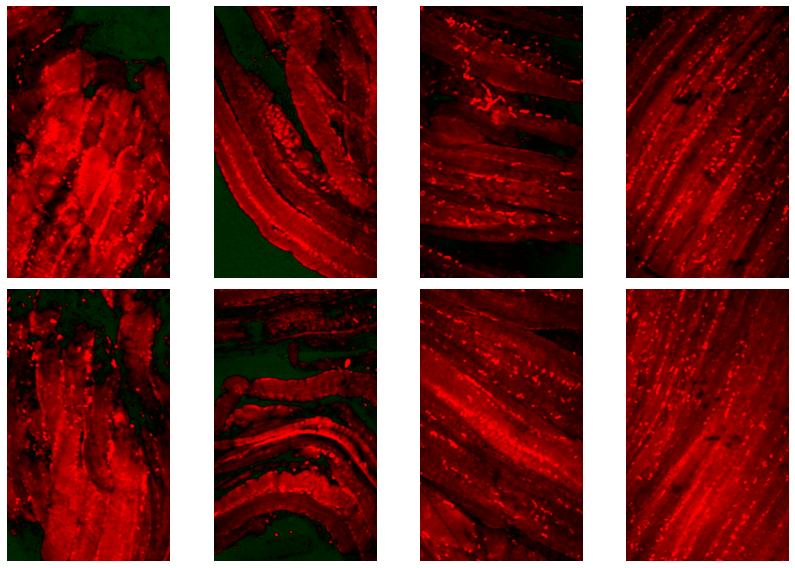

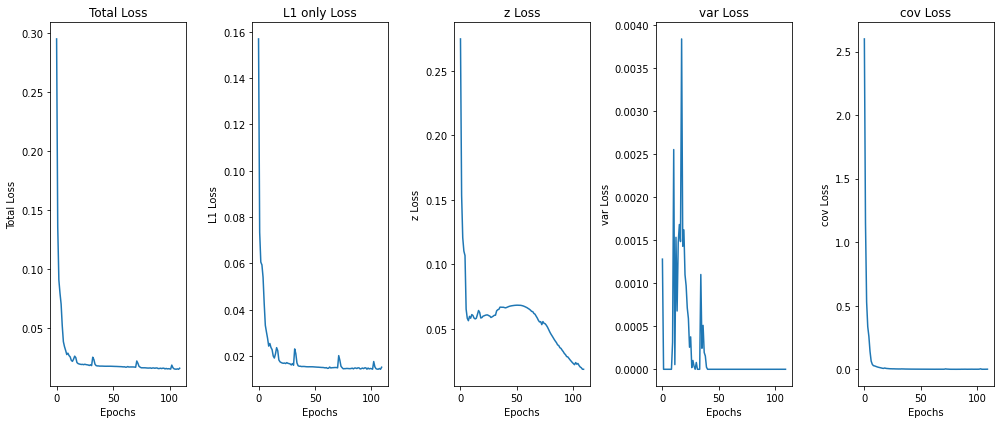

 56%|██████████████████████▊                  | 111/200 [00:46<00:44,  1.99it/s]

Epoch: 111, Total Loss : 0.014895, L1 only: 0.014232, Z Loss: 0.018596, Var Loss: 0.000000, Cov Loss: 0.002113


 56%|██████████████████████▉                  | 112/200 [00:46<00:39,  2.21it/s]

Epoch: 112, Total Loss : 0.014898, L1 only: 0.014292, Z Loss: 0.017712, Var Loss: 0.000000, Cov Loss: 0.001486


 56%|███████████████████████▏                 | 113/200 [00:46<00:36,  2.40it/s]

Epoch: 113, Total Loss : 0.014621, L1 only: 0.014042, Z Loss: 0.016907, Var Loss: 0.000000, Cov Loss: 0.001440


 57%|███████████████████████▎                 | 114/200 [00:47<00:33,  2.55it/s]

Epoch: 114, Total Loss : 0.014945, L1 only: 0.014385, Z Loss: 0.016027, Var Loss: 0.000000, Cov Loss: 0.001576


 57%|███████████████████████▌                 | 115/200 [00:47<00:31,  2.67it/s]

Epoch: 115, Total Loss : 0.015099, L1 only: 0.014534, Z Loss: 0.015668, Var Loss: 0.000000, Cov Loss: 0.001892


 58%|███████████████████████▊                 | 116/200 [00:47<00:30,  2.76it/s]

Epoch: 116, Total Loss : 0.015016, L1 only: 0.014442, Z Loss: 0.015606, Var Loss: 0.000000, Cov Loss: 0.002119


 58%|███████████████████████▉                 | 117/200 [00:48<00:29,  2.82it/s]

Epoch: 117, Total Loss : 0.014455, L1 only: 0.013936, Z Loss: 0.014798, Var Loss: 0.000000, Cov Loss: 0.001493


 59%|████████████████████████▏                | 118/200 [00:48<00:28,  2.87it/s]

Epoch: 118, Total Loss : 0.014854, L1 only: 0.014351, Z Loss: 0.014398, Var Loss: 0.000000, Cov Loss: 0.001424


 60%|████████████████████████▍                | 119/200 [00:48<00:27,  2.91it/s]

Epoch: 119, Total Loss : 0.014445, L1 only: 0.013970, Z Loss: 0.013529, Var Loss: 0.000000, Cov Loss: 0.001397
Epoch: 120, Total Loss : 0.014620, L1 only: 0.014154, Z Loss: 0.013379, Var Loss: 0.000000, Cov Loss: 0.001292


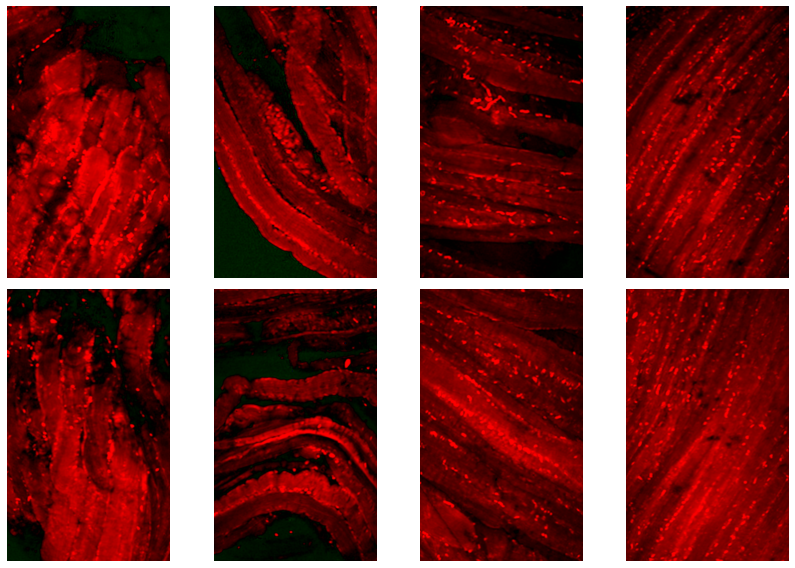

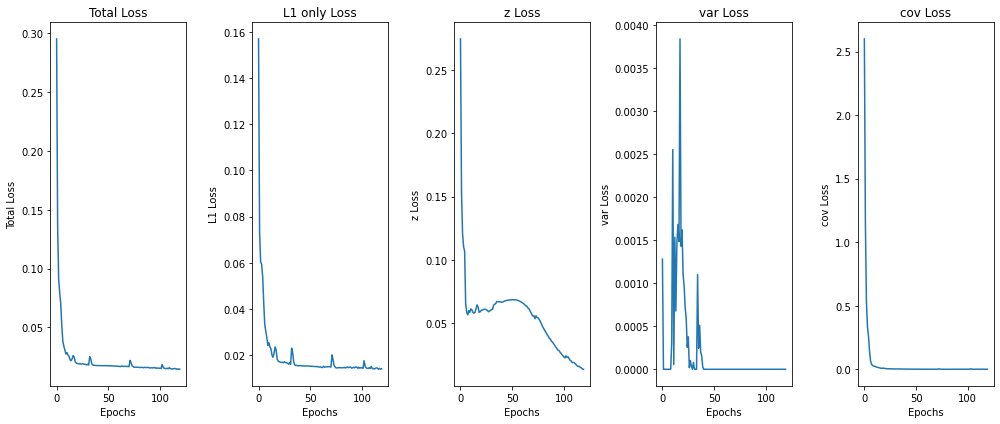

 60%|████████████████████████▊                | 121/200 [00:50<00:40,  1.93it/s]

Epoch: 121, Total Loss : 0.014969, L1 only: 0.014475, Z Loss: 0.013885, Var Loss: 0.000000, Cov Loss: 0.001553


 61%|█████████████████████████                | 122/200 [00:50<00:36,  2.17it/s]

Epoch: 122, Total Loss : 0.014616, L1 only: 0.014138, Z Loss: 0.013465, Var Loss: 0.000000, Cov Loss: 0.001490


 62%|█████████████████████████▏               | 123/200 [00:51<00:32,  2.36it/s]

Epoch: 123, Total Loss : 0.014266, L1 only: 0.013813, Z Loss: 0.013131, Var Loss: 0.000000, Cov Loss: 0.001188


 62%|█████████████████████████▍               | 124/200 [00:51<00:30,  2.52it/s]

Epoch: 124, Total Loss : 0.014402, L1 only: 0.013960, Z Loss: 0.013007, Var Loss: 0.000000, Cov Loss: 0.001024


 62%|█████████████████████████▋               | 125/200 [00:51<00:28,  2.65it/s]

Epoch: 125, Total Loss : 0.016952, L1 only: 0.016359, Z Loss: 0.015815, Var Loss: 0.000000, Cov Loss: 0.002377


 63%|█████████████████████████▊               | 126/200 [00:52<00:27,  2.74it/s]

Epoch: 126, Total Loss : 0.015288, L1 only: 0.014686, Z Loss: 0.014917, Var Loss: 0.000000, Cov Loss: 0.003083


 64%|██████████████████████████               | 127/200 [00:52<00:25,  2.81it/s]

Epoch: 127, Total Loss : 0.014632, L1 only: 0.014137, Z Loss: 0.014175, Var Loss: 0.000000, Cov Loss: 0.001404


 64%|██████████████████████████▏              | 128/200 [00:52<00:25,  2.86it/s]

Epoch: 128, Total Loss : 0.014347, L1 only: 0.013883, Z Loss: 0.013574, Var Loss: 0.000000, Cov Loss: 0.001129


 64%|██████████████████████████▍              | 129/200 [00:53<00:24,  2.90it/s]

Epoch: 129, Total Loss : 0.014133, L1 only: 0.013700, Z Loss: 0.012912, Var Loss: 0.000000, Cov Loss: 0.000917
Epoch: 130, Total Loss : 0.014086, L1 only: 0.013662, Z Loss: 0.012787, Var Loss: 0.000000, Cov Loss: 0.000816


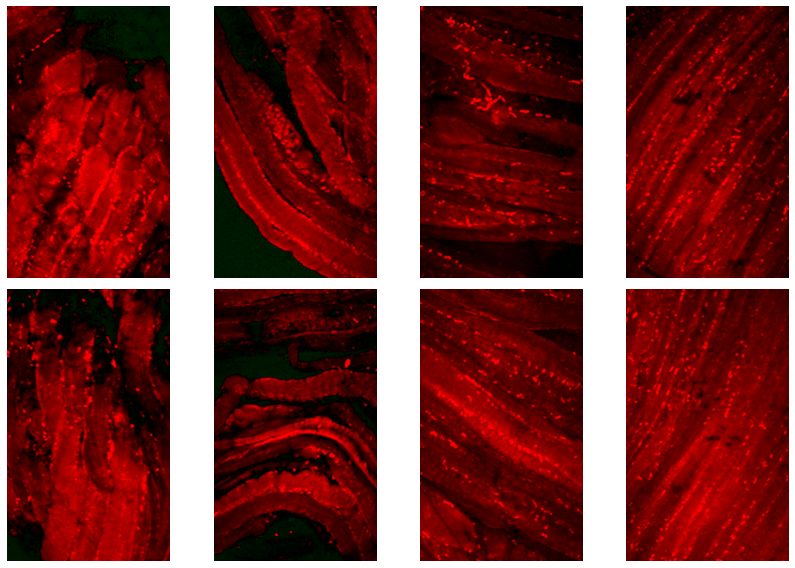

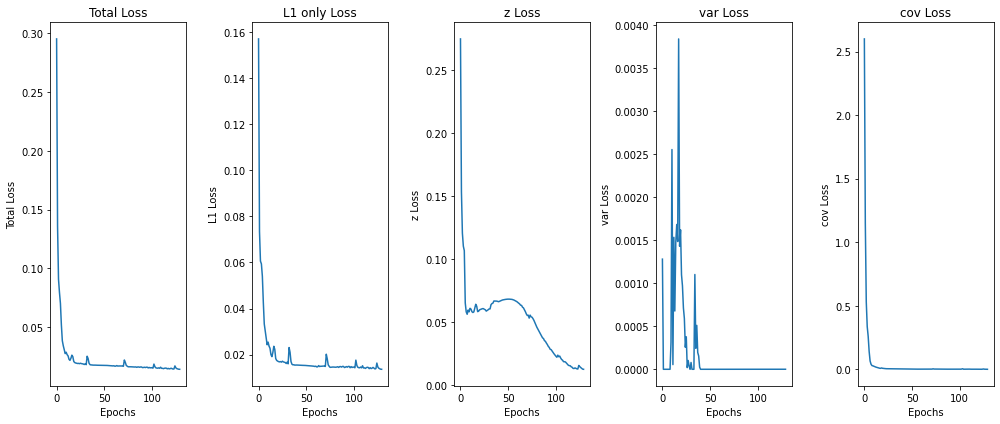

 66%|██████████████████████████▊              | 131/200 [00:54<00:35,  1.92it/s]

Epoch: 131, Total Loss : 0.014045, L1 only: 0.013620, Z Loss: 0.012851, Var Loss: 0.000001, Cov Loss: 0.000793


 66%|███████████████████████████              | 132/200 [00:54<00:31,  2.16it/s]

Epoch: 132, Total Loss : 0.014102, L1 only: 0.013671, Z Loss: 0.013068, Var Loss: 0.000001, Cov Loss: 0.000779


 66%|███████████████████████████▎             | 133/200 [00:55<00:28,  2.35it/s]

Epoch: 133, Total Loss : 0.013972, L1 only: 0.013540, Z Loss: 0.013108, Var Loss: 0.000001, Cov Loss: 0.000765


 67%|███████████████████████████▍             | 134/200 [00:55<00:26,  2.51it/s]

Epoch: 134, Total Loss : 0.013938, L1 only: 0.013505, Z Loss: 0.013208, Var Loss: 0.000001, Cov Loss: 0.000731


 68%|███████████████████████████▋             | 135/200 [00:55<00:24,  2.64it/s]

Epoch: 135, Total Loss : 0.018604, L1 only: 0.017935, Z Loss: 0.017574, Var Loss: 0.000001, Cov Loss: 0.002837


 68%|███████████████████████████▉             | 136/200 [00:56<00:23,  2.74it/s]

Epoch: 136, Total Loss : 0.020104, L1 only: 0.019242, Z Loss: 0.019181, Var Loss: 0.000001, Cov Loss: 0.005740


 68%|████████████████████████████             | 137/200 [00:56<00:22,  2.81it/s]

Epoch: 137, Total Loss : 0.014590, L1 only: 0.014062, Z Loss: 0.015405, Var Loss: 0.000000, Cov Loss: 0.001304


 69%|████████████████████████████▎            | 138/200 [00:56<00:21,  2.86it/s]

Epoch: 138, Total Loss : 0.014099, L1 only: 0.013656, Z Loss: 0.013569, Var Loss: 0.000001, Cov Loss: 0.000716


 70%|████████████████████████████▍            | 139/200 [00:57<00:21,  2.90it/s]

Epoch: 139, Total Loss : 0.014181, L1 only: 0.013764, Z Loss: 0.012895, Var Loss: 0.000001, Cov Loss: 0.000612
Epoch: 140, Total Loss : 0.014020, L1 only: 0.013613, Z Loss: 0.012680, Var Loss: 0.000001, Cov Loss: 0.000543


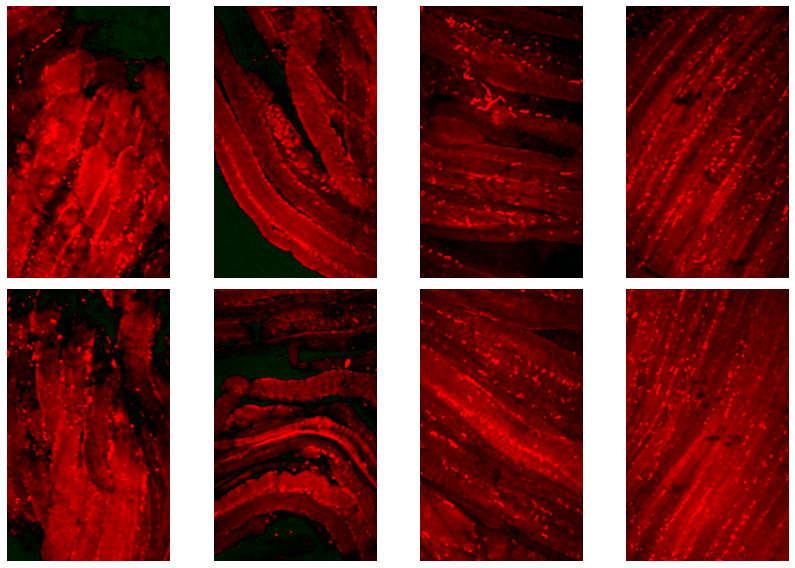

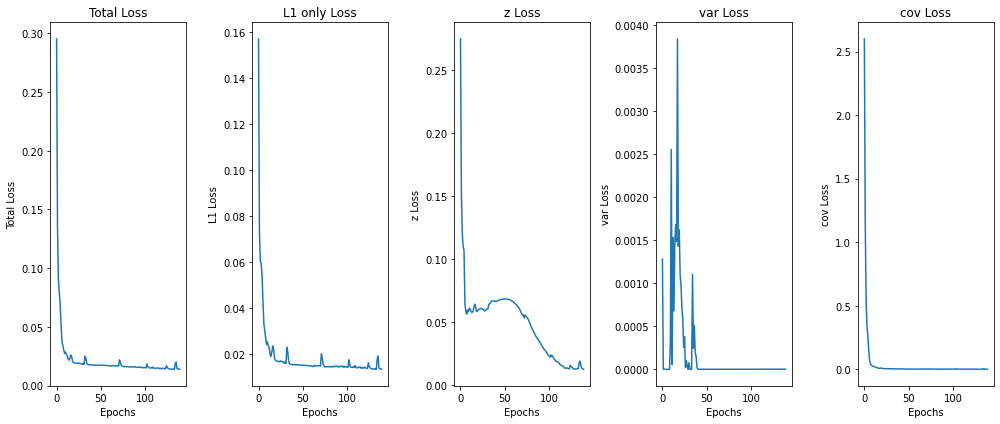

 70%|████████████████████████████▉            | 141/200 [00:58<00:29,  1.98it/s]

Epoch: 141, Total Loss : 0.013967, L1 only: 0.013560, Z Loss: 0.012743, Var Loss: 0.000001, Cov Loss: 0.000497


 71%|█████████████████████████████            | 142/200 [00:59<00:26,  2.21it/s]

Epoch: 142, Total Loss : 0.013968, L1 only: 0.013558, Z Loss: 0.012837, Var Loss: 0.000001, Cov Loss: 0.000498


 72%|█████████████████████████████▎           | 143/200 [00:59<00:23,  2.39it/s]

Epoch: 143, Total Loss : 0.013936, L1 only: 0.013525, Z Loss: 0.012893, Var Loss: 0.000001, Cov Loss: 0.000496


 72%|█████████████████████████████▌           | 144/200 [00:59<00:22,  2.55it/s]

Epoch: 144, Total Loss : 0.014060, L1 only: 0.013642, Z Loss: 0.013065, Var Loss: 0.000001, Cov Loss: 0.000530


 72%|█████████████████████████████▋           | 145/200 [01:00<00:20,  2.67it/s]

Epoch: 145, Total Loss : 0.014099, L1 only: 0.013667, Z Loss: 0.013244, Var Loss: 0.000001, Cov Loss: 0.000693


 73%|█████████████████████████████▉           | 146/200 [01:00<00:19,  2.75it/s]

Epoch: 146, Total Loss : 0.013878, L1 only: 0.013454, Z Loss: 0.013179, Var Loss: 0.000001, Cov Loss: 0.000563


 74%|██████████████████████████████▏          | 147/200 [01:00<00:18,  2.82it/s]

Epoch: 147, Total Loss : 0.013867, L1 only: 0.013446, Z Loss: 0.013195, Var Loss: 0.000001, Cov Loss: 0.000492


 74%|██████████████████████████████▎          | 148/200 [01:01<00:18,  2.87it/s]

Epoch: 148, Total Loss : 0.013977, L1 only: 0.013553, Z Loss: 0.013316, Var Loss: 0.000001, Cov Loss: 0.000497


 74%|██████████████████████████████▌          | 149/200 [01:01<00:17,  2.90it/s]

Epoch: 149, Total Loss : 0.014062, L1 only: 0.013627, Z Loss: 0.013490, Var Loss: 0.000001, Cov Loss: 0.000601
Epoch: 150, Total Loss : 0.013887, L1 only: 0.013451, Z Loss: 0.013543, Var Loss: 0.000001, Cov Loss: 0.000586


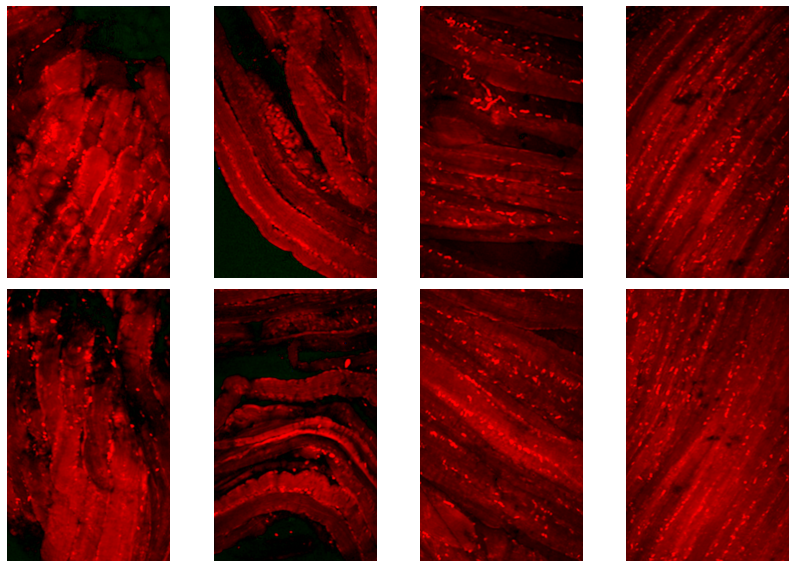

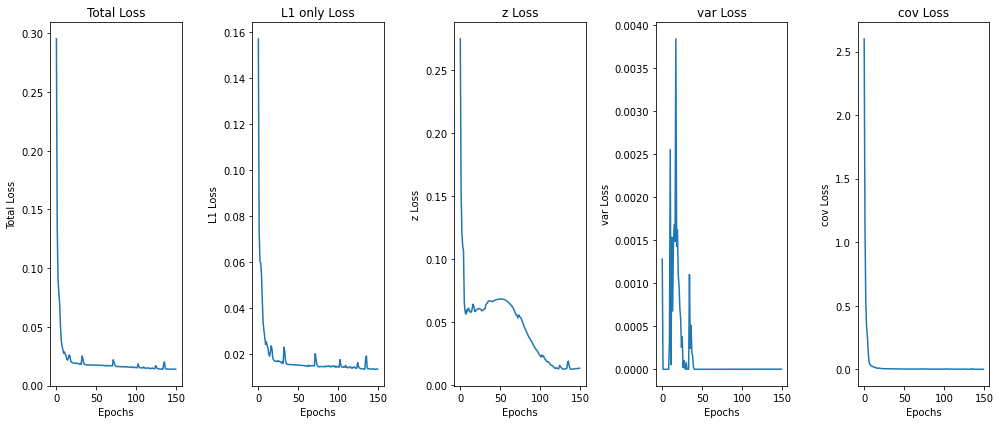

 76%|██████████████████████████████▉          | 151/200 [01:02<00:25,  1.92it/s]

Epoch: 151, Total Loss : 0.013739, L1 only: 0.013315, Z Loss: 0.013355, Var Loss: 0.000001, Cov Loss: 0.000450


 76%|███████████████████████████████▏         | 152/200 [01:03<00:22,  2.15it/s]

Epoch: 152, Total Loss : 0.013813, L1 only: 0.013389, Z Loss: 0.013452, Var Loss: 0.000001, Cov Loss: 0.000407


 76%|███████████████████████████████▎         | 153/200 [01:03<00:20,  2.35it/s]

Epoch: 153, Total Loss : 0.013731, L1 only: 0.013308, Z Loss: 0.013404, Var Loss: 0.000001, Cov Loss: 0.000418


 77%|███████████████████████████████▌         | 154/200 [01:03<00:18,  2.51it/s]

Epoch: 154, Total Loss : 0.013689, L1 only: 0.013266, Z Loss: 0.013499, Var Loss: 0.000001, Cov Loss: 0.000367


 78%|███████████████████████████████▊         | 155/200 [01:04<00:17,  2.64it/s]

Epoch: 155, Total Loss : 0.013688, L1 only: 0.013263, Z Loss: 0.013589, Var Loss: 0.000001, Cov Loss: 0.000341


 78%|███████████████████████████████▉         | 156/200 [01:04<00:16,  2.73it/s]

Epoch: 156, Total Loss : 0.013982, L1 only: 0.013544, Z Loss: 0.013971, Var Loss: 0.000001, Cov Loss: 0.000374


 78%|████████████████████████████████▏        | 157/200 [01:04<00:15,  2.81it/s]

Epoch: 157, Total Loss : 0.013794, L1 only: 0.013352, Z Loss: 0.013739, Var Loss: 0.000001, Cov Loss: 0.000598


 79%|████████████████████████████████▍        | 158/200 [01:05<00:14,  2.86it/s]

Epoch: 158, Total Loss : 0.013666, L1 only: 0.013235, Z Loss: 0.013774, Var Loss: 0.000001, Cov Loss: 0.000354


 80%|████████████████████████████████▌        | 159/200 [01:05<00:14,  2.90it/s]

Epoch: 159, Total Loss : 0.013734, L1 only: 0.013301, Z Loss: 0.013812, Var Loss: 0.000001, Cov Loss: 0.000362
Epoch: 160, Total Loss : 0.013619, L1 only: 0.013192, Z Loss: 0.013681, Var Loss: 0.000001, Cov Loss: 0.000333


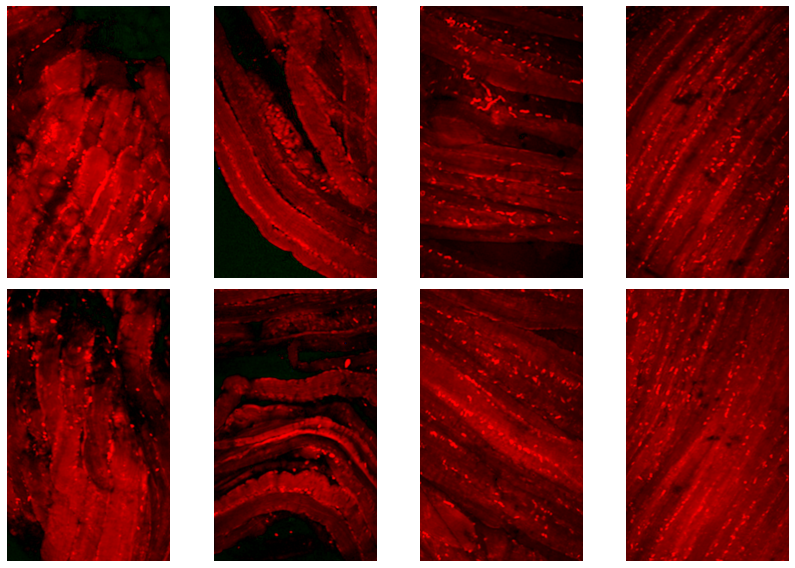

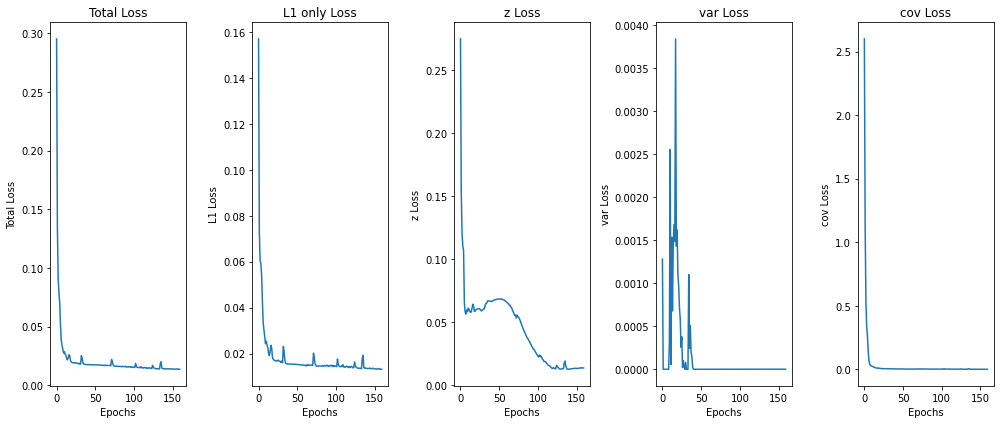

 80%|█████████████████████████████████        | 161/200 [01:07<00:20,  1.92it/s]

Epoch: 161, Total Loss : 0.014660, L1 only: 0.014194, Z Loss: 0.014643, Var Loss: 0.000001, Cov Loss: 0.000521


 81%|█████████████████████████████████▏       | 162/200 [01:07<00:17,  2.15it/s]

Epoch: 162, Total Loss : 0.013993, L1 only: 0.013521, Z Loss: 0.014266, Var Loss: 0.000001, Cov Loss: 0.000871


 82%|█████████████████████████████████▍       | 163/200 [01:07<00:15,  2.35it/s]

Epoch: 163, Total Loss : 0.013640, L1 only: 0.013209, Z Loss: 0.013681, Var Loss: 0.000001, Cov Loss: 0.000411


 82%|█████████████████████████████████▌       | 164/200 [01:08<00:14,  2.51it/s]

Epoch: 164, Total Loss : 0.013618, L1 only: 0.013195, Z Loss: 0.013547, Var Loss: 0.000001, Cov Loss: 0.000328


 82%|█████████████████████████████████▊       | 165/200 [01:08<00:13,  2.64it/s]

Epoch: 165, Total Loss : 0.013824, L1 only: 0.013395, Z Loss: 0.013777, Var Loss: 0.000001, Cov Loss: 0.000308


 83%|██████████████████████████████████       | 166/200 [01:08<00:12,  2.73it/s]

Epoch: 166, Total Loss : 0.013629, L1 only: 0.013203, Z Loss: 0.013624, Var Loss: 0.000001, Cov Loss: 0.000349


 84%|██████████████████████████████████▏      | 167/200 [01:09<00:11,  2.80it/s]

Epoch: 167, Total Loss : 0.013629, L1 only: 0.013204, Z Loss: 0.013703, Var Loss: 0.000001, Cov Loss: 0.000288


 84%|██████████████████████████████████▍      | 168/200 [01:09<00:11,  2.86it/s]

Epoch: 168, Total Loss : 0.013656, L1 only: 0.013227, Z Loss: 0.013775, Var Loss: 0.000001, Cov Loss: 0.000325


 84%|██████████████████████████████████▋      | 169/200 [01:09<00:10,  2.90it/s]

Epoch: 169, Total Loss : 0.013605, L1 only: 0.013180, Z Loss: 0.013748, Var Loss: 0.000001, Cov Loss: 0.000255
Epoch: 170, Total Loss : 0.013559, L1 only: 0.013133, Z Loss: 0.013748, Var Loss: 0.000001, Cov Loss: 0.000264


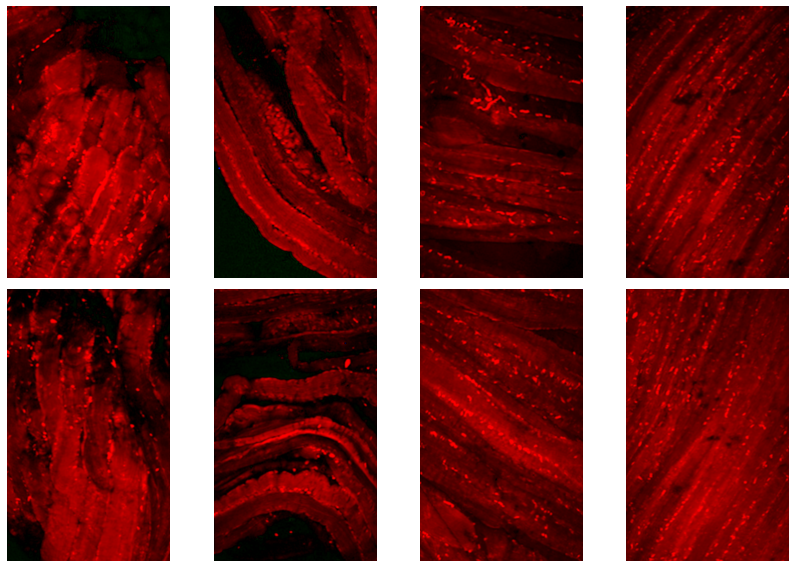

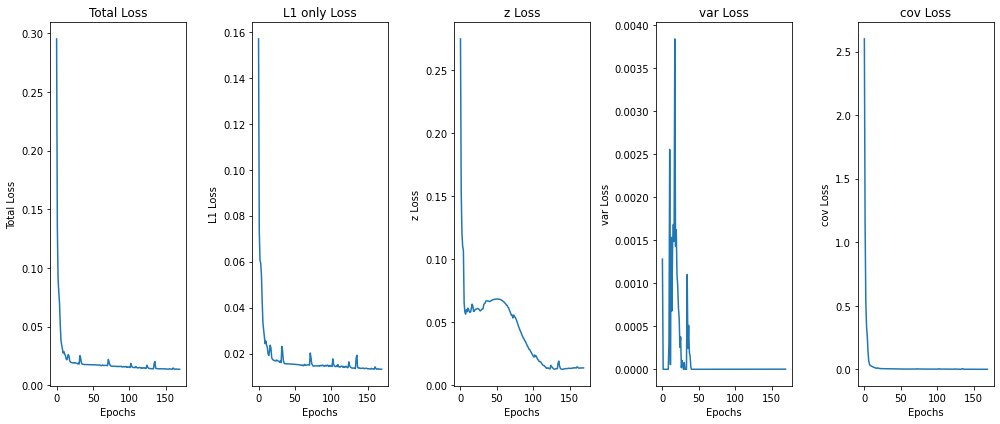

 86%|███████████████████████████████████      | 171/200 [01:11<00:14,  1.98it/s]

Epoch: 171, Total Loss : 0.013612, L1 only: 0.013186, Z Loss: 0.013805, Var Loss: 0.000002, Cov Loss: 0.000241


 86%|███████████████████████████████████▎     | 172/200 [01:11<00:12,  2.21it/s]

Epoch: 172, Total Loss : 0.014646, L1 only: 0.014177, Z Loss: 0.014731, Var Loss: 0.000001, Cov Loss: 0.000546


 86%|███████████████████████████████████▍     | 173/200 [01:11<00:11,  2.39it/s]

Epoch: 173, Total Loss : 0.014057, L1 only: 0.013586, Z Loss: 0.014431, Var Loss: 0.000001, Cov Loss: 0.000754


 87%|███████████████████████████████████▋     | 174/200 [01:12<00:10,  2.54it/s]

Epoch: 174, Total Loss : 0.013565, L1 only: 0.013135, Z Loss: 0.013634, Var Loss: 0.000001, Cov Loss: 0.000418


 88%|███████████████████████████████████▉     | 175/200 [01:12<00:09,  2.67it/s]

Epoch: 175, Total Loss : 0.013547, L1 only: 0.013130, Z Loss: 0.013442, Var Loss: 0.000001, Cov Loss: 0.000284


 88%|████████████████████████████████████     | 176/200 [01:12<00:08,  2.75it/s]

Epoch: 176, Total Loss : 0.013616, L1 only: 0.013197, Z Loss: 0.013557, Var Loss: 0.000002, Cov Loss: 0.000254


 88%|████████████████████████████████████▎    | 177/200 [01:13<00:08,  2.82it/s]

Epoch: 177, Total Loss : 0.013561, L1 only: 0.013141, Z Loss: 0.013558, Var Loss: 0.000002, Cov Loss: 0.000276


 89%|████████████████████████████████████▍    | 178/200 [01:13<00:07,  2.87it/s]

Epoch: 178, Total Loss : 0.014028, L1 only: 0.013592, Z Loss: 0.014026, Var Loss: 0.000002, Cov Loss: 0.000297


 90%|████████████████████████████████████▋    | 179/200 [01:13<00:07,  2.90it/s]

Epoch: 179, Total Loss : 0.013934, L1 only: 0.013487, Z Loss: 0.014010, Var Loss: 0.000001, Cov Loss: 0.000534
Epoch: 180, Total Loss : 0.013720, L1 only: 0.013284, Z Loss: 0.013818, Var Loss: 0.000001, Cov Loss: 0.000434


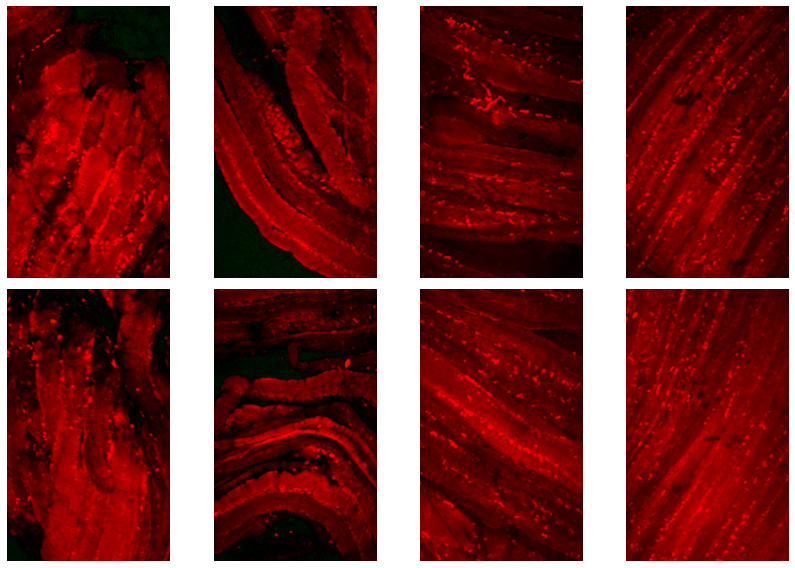

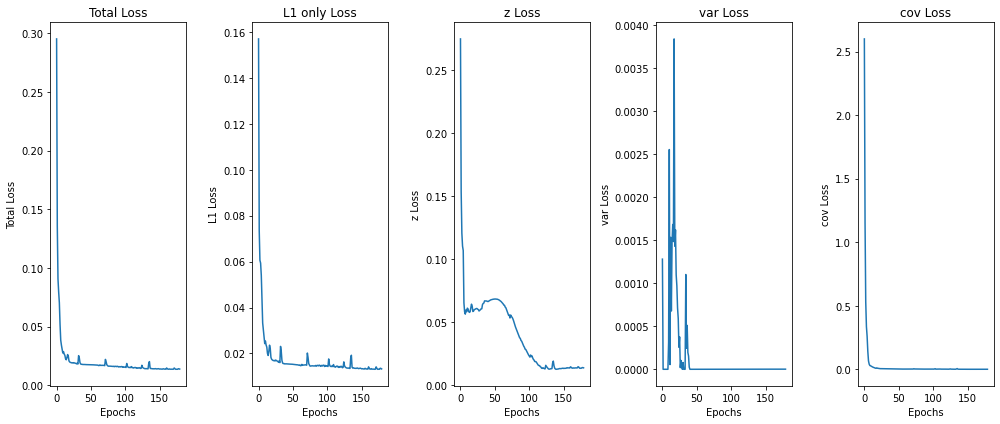

 90%|█████████████████████████████████████    | 181/200 [01:15<00:09,  1.92it/s]

Epoch: 181, Total Loss : 0.013530, L1 only: 0.013113, Z Loss: 0.013448, Var Loss: 0.000002, Cov Loss: 0.000281


 91%|█████████████████████████████████████▎   | 182/200 [01:15<00:08,  2.15it/s]

Epoch: 182, Total Loss : 0.013687, L1 only: 0.013266, Z Loss: 0.013595, Var Loss: 0.000002, Cov Loss: 0.000250


 92%|█████████████████████████████████████▌   | 183/200 [01:16<00:07,  2.34it/s]

Epoch: 183, Total Loss : 0.013661, L1 only: 0.013237, Z Loss: 0.013602, Var Loss: 0.000002, Cov Loss: 0.000320


 92%|█████████████████████████████████████▋   | 184/200 [01:16<00:06,  2.51it/s]

Epoch: 184, Total Loss : 0.013740, L1 only: 0.013314, Z Loss: 0.013697, Var Loss: 0.000002, Cov Loss: 0.000306


 92%|█████████████████████████████████████▉   | 185/200 [01:16<00:05,  2.63it/s]

Epoch: 185, Total Loss : 0.013969, L1 only: 0.013529, Z Loss: 0.013966, Var Loss: 0.000002, Cov Loss: 0.000413


 93%|██████████████████████████████████████▏  | 186/200 [01:17<00:05,  2.73it/s]

Epoch: 186, Total Loss : 0.013731, L1 only: 0.013294, Z Loss: 0.013759, Var Loss: 0.000002, Cov Loss: 0.000481


 94%|██████████████████████████████████████▎  | 187/200 [01:17<00:04,  2.80it/s]

Epoch: 187, Total Loss : 0.013492, L1 only: 0.013078, Z Loss: 0.013343, Var Loss: 0.000002, Cov Loss: 0.000262


 94%|██████████████████████████████████████▌  | 188/200 [01:17<00:04,  2.85it/s]

Epoch: 188, Total Loss : 0.013483, L1 only: 0.013073, Z Loss: 0.013301, Var Loss: 0.000002, Cov Loss: 0.000214


 94%|██████████████████████████████████████▋  | 189/200 [01:18<00:03,  2.89it/s]

Epoch: 189, Total Loss : 0.013801, L1 only: 0.013379, Z Loss: 0.013646, Var Loss: 0.000002, Cov Loss: 0.000235
Epoch: 190, Total Loss : 0.013865, L1 only: 0.013430, Z Loss: 0.013810, Var Loss: 0.000002, Cov Loss: 0.000422


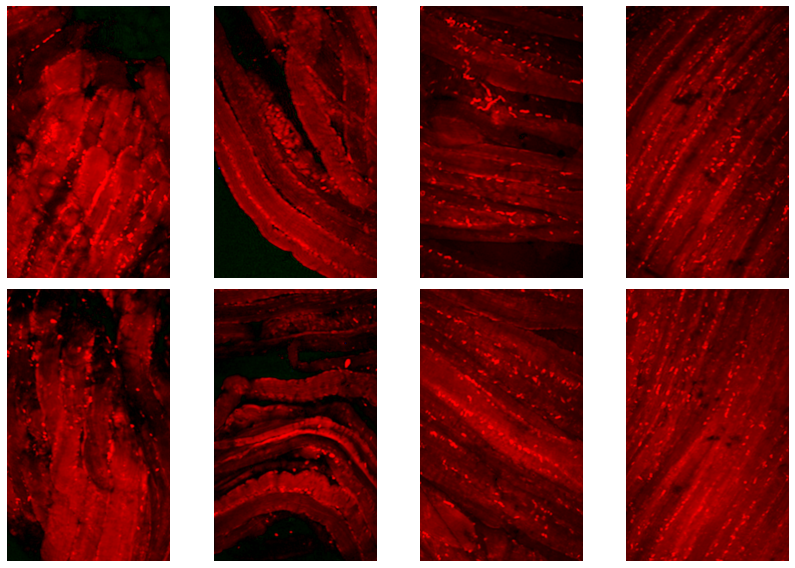

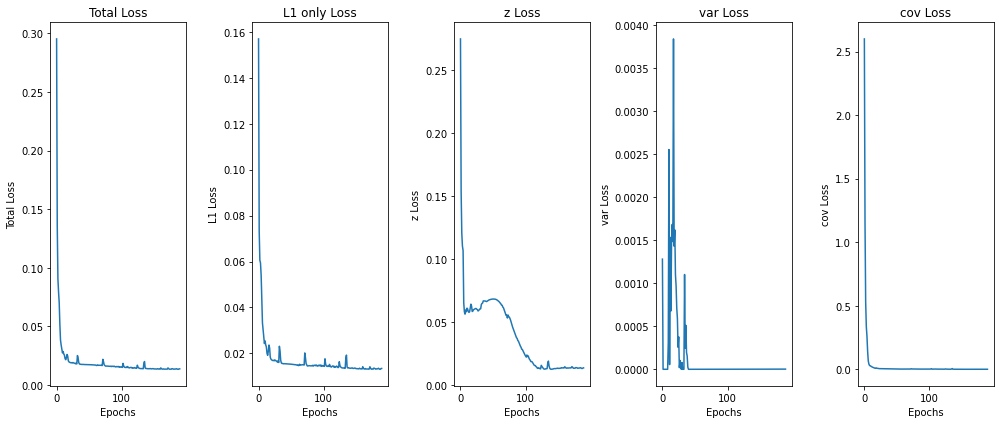

 96%|███████████████████████████████████████▏ | 191/200 [01:19<00:04,  1.99it/s]

Epoch: 191, Total Loss : 0.013739, L1 only: 0.013305, Z Loss: 0.013786, Var Loss: 0.000002, Cov Loss: 0.000416


 96%|███████████████████████████████████████▎ | 192/200 [01:19<00:03,  2.21it/s]

Epoch: 192, Total Loss : 0.013463, L1 only: 0.013051, Z Loss: 0.013311, Var Loss: 0.000002, Cov Loss: 0.000265


 96%|███████████████████████████████████████▌ | 193/200 [01:20<00:02,  2.40it/s]

Epoch: 193, Total Loss : 0.013464, L1 only: 0.013055, Z Loss: 0.013267, Var Loss: 0.000002, Cov Loss: 0.000202


 97%|███████████████████████████████████████▊ | 194/200 [01:20<00:02,  2.55it/s]

Epoch: 194, Total Loss : 0.013653, L1 only: 0.013239, Z Loss: 0.013493, Var Loss: 0.000002, Cov Loss: 0.000195


 98%|███████████████████████████████████████▉ | 195/200 [01:20<00:01,  2.67it/s]

Epoch: 195, Total Loss : 0.013679, L1 only: 0.013258, Z Loss: 0.013539, Var Loss: 0.000002, Cov Loss: 0.000295


 98%|████████████████████████████████████████▏| 196/200 [01:21<00:01,  2.75it/s]

Epoch: 196, Total Loss : 0.013884, L1 only: 0.013454, Z Loss: 0.013814, Var Loss: 0.000002, Cov Loss: 0.000314


 98%|████████████████████████████████████████▍| 197/200 [01:21<00:01,  2.82it/s]

Epoch: 197, Total Loss : 0.013742, L1 only: 0.013307, Z Loss: 0.013731, Var Loss: 0.000002, Cov Loss: 0.000458


 99%|████████████████████████████████████████▌| 198/200 [01:21<00:00,  2.87it/s]

Epoch: 198, Total Loss : 0.013460, L1 only: 0.013049, Z Loss: 0.013257, Var Loss: 0.000002, Cov Loss: 0.000260


100%|████████████████████████████████████████▊| 199/200 [01:22<00:00,  2.90it/s]

Epoch: 199, Total Loss : 0.013454, L1 only: 0.013046, Z Loss: 0.013219, Var Loss: 0.000002, Cov Loss: 0.000223
Epoch: 200, Total Loss : 0.013612, L1 only: 0.013202, Z Loss: 0.013338, Var Loss: 0.000002, Cov Loss: 0.000194


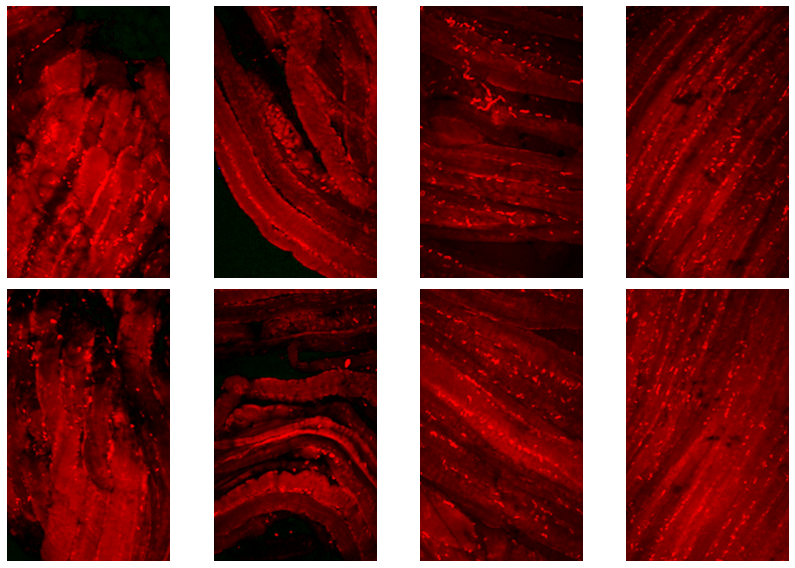

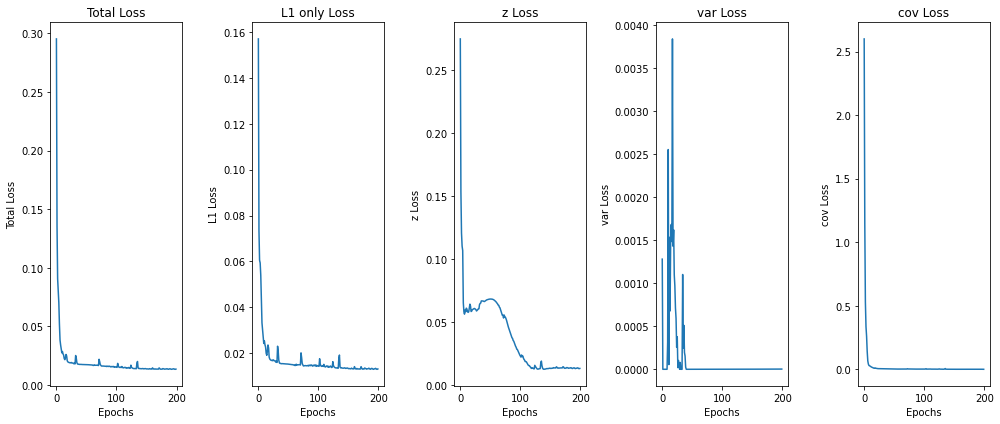

100%|█████████████████████████████████████████| 200/200 [01:23<00:00,  2.40it/s]


In [17]:
n_epochs = 200
train_loss_arr = []
l1_loss_arr = []
z_loss_arr = []
var_loss_arr = []
cov_loss_arr = []
z_imgs = []
temp_img_arr = []
lambda_1 = 0.03
lambda_2 = 0.05
lambda_3 = 0.05

for epoch in tqdm(range(1, n_epochs+1)):
    # monitor training loss
    train_loss = 0.0
    l1_loss = 0.0
    z_loss = 0.0
    var_loss = 0.0
    cov_loss = 0.0

    #Training
    for images in img_stack:
        images = images[None, :]
        image_x_p = torch.permute(images, (0, 3, 1, 2))
        image_x_p = image_x_p.to(device)
        optimizer.zero_grad() 
        z = model.forward_enc(image_x_p)
        outputs = model.decoder(z)
        loss_l1 = criterion(outputs, image_x_p)
        
        # compute a z_loss based on the image averages
        stack_avg = torch.mean(torch.abs(image_x_p), 1)
        out_avg = torch.mean(torch.abs(z), 1)
        loss_z = criterion(stack_avg, out_avg)
        
        # variance-ordering loss
        msq0 = meansq(z[:,0,:,:])
        msq1 = meansq(z[:,1,:,:])
        msq2 = meansq(z[:,2,:,:])
        loss_var = f.relu(msq1-msq0) + f.relu(msq2-msq1)
        
        # covariance loss among the color channels
        cov_ab = abs_cov(z[:,0,:,:], z[:,1,:,:])
        cov_bc = abs_cov(z[:,1,:,:], z[:,2,:,:])
        cov_ca = abs_cov(z[:,2,:,:], z[:,0,:,:])
        loss_cov = cov_ab + cov_bc + cov_ca
        
        # total loss should have contributions from all the losses
        loss_total = loss_l1 + lambda_1*loss_z + lambda_2*loss_var + lambda_3*loss_cov
        loss_total.backward()
        optimizer.step()
        
        train_loss += loss_total.item()*image_x_p.size(0)
        l1_loss += loss_l1.item()*image_x_p.size(0)
        z_loss += loss_z.item()*image_x_p.size(0)
        var_loss += loss_var.item()*image_x_p.size(0)
        cov_loss += loss_cov.item()*image_x_p.size(0)

    train_loss = train_loss/len(img_stack)
    l1_loss = l1_loss/len(img_stack)
    z_loss = z_loss/len(img_stack)
    var_loss = var_loss/len(img_stack)
    cov_loss = cov_loss/len(img_stack)
    
    print('Epoch: {}, Total Loss : {:.6f}, L1 only: {:.6f}, Z Loss: {:.6f}, Var Loss: {:.6f}, Cov Loss: {:.6f}'
          .format(epoch, train_loss, l1_loss, z_loss, var_loss, cov_loss))                                                                                                
                                                                                                     
    train_loss_arr.append(train_loss)
    l1_loss_arr.append(l1_loss)
    z_loss_arr.append(z_loss)
    var_loss_arr.append(var_loss)
    cov_loss_arr.append(cov_loss)
        
    if epoch%10 == 0:
        # visualize latent space
        ind_array = [0, 1, 4, 5, 2, 6, -3, -2]
        for i in ind_array:
            temp_img = visualize_z(i)
            temp_img_arr.append(temp_img)
        
        z_imgs.append(temp_img_arr)
        
        plt.figure(figsize=(12,8))
        for k in range(0,len(temp_img_arr)):
            plt.subplot(2,4,k+1)
            plt.imshow(temp_img_arr[k])
            plt.axis('off')
        plt.tight_layout()
        plt.show()
        temp_img_arr = []
        
        
        # making subplots
        fig, ax = plt.subplots(1, 5)
        fig.set_size_inches(14,6)
        
        # set data with subplots and plot
        ax[0].plot(train_loss_arr)
        ax[0].set_title('Total Loss')
        ax[0].set_xlabel('Epochs')
        ax[0].set_ylabel('Total Loss')
        
        ax[1].plot(l1_loss_arr)
        ax[1].set_title('L1 only Loss')
        ax[1].set_xlabel('Epochs')
        ax[1].set_ylabel('L1 Loss')
#         ax[1].set_ylim([0, 0.05])
        
        ax[2].plot(z_loss_arr)
        ax[2].set_title('z Loss')
        ax[2].set_xlabel('Epochs')
        ax[2].set_ylabel('z Loss')
        
        ax[3].plot(var_loss_arr)
        ax[3].set_title('var Loss')
        ax[3].set_xlabel('Epochs')
        ax[3].set_ylabel('var Loss')
        
        ax[4].plot(cov_loss_arr)
        ax[4].set_title('cov Loss')
        ax[4].set_xlabel('Epochs')
        ax[4].set_ylabel('cov Loss')
        
        plt.tight_layout()
        plt.show()
        

In [18]:
# torch.save(model,'/home/arya1080/python_projects/CNN_TAM/20220310_1')

In [19]:
# model = torch.load('/home/arya1080/python_projects/CNN_TAM/20220310_1')

## Separate dataset based on image type

In [20]:
# red_perm = []
# ox_perm = []
# red_intact = []
# ox_intact = []

# for files in filenames:
#     if 'red perm' in files:
#         img = io.imread(data_dir + files)
#         red_perm.append(img)
        
#     if 'ox perm' in files:
#         img = io.imread(data_dir + files)
#         ox_perm.append(img)
        
#     if 'red intact' in files:
#         img = io.imread(data_dir + files)
#         red_intact.append(img)
        
#     if 'ox intact' in files:
#         img = io.imread(data_dir + files)
#         ox_intact.append(img)

# red_perm = np.array(red_perm)
# ox_perm = np.array(ox_perm)
# red_intact = np.array(red_intact)
# ox_intact = np.array(ox_intact)    

# print('red_perm lenth = {}, ox_perm length = {}, red_intact length = {}, ox_intact length = {}'.format(len(red_perm), 
#      len(ox_perm), len(red_intact), len(ox_intact)))

In [21]:
def visualize_z_offline(img_stack, model):
    img_arr = []
    img_stack = img_stack.astype('float32')
    img_stack = torch.tensor(img_stack)
    img_stack = img_stack.to(device)
    for data in img_stack:
        data = data[None,:]
        data = data.to(device)
        out = model.forward_enc(torch.permute(data, (0, 3, 1, 2)))
        out = out[0,:,:,:]
        out = torch.permute(out, (1,2,0))
        img = out.detach().cpu().numpy()
        img_arr.append(img)
    img_arr = np.array(img_arr)
    
    for img in img_arr:
        plt.imshow(img)
        plt.show()
   
#     fig, ax = plt.subplots(1, len(img_arr))
#     fig.set_size_inches(12,8)
#     for i in range(len(img_arr)):
#         ax[i].plot(img_arr[i])
#     fig.tight_layout()
#     plt.show()
    
#     fig, ax = plt.subplots()
#     for i in range(0,len(img_arr)):
#         ax.add_subplot(8, 2, 1+i) 
#         ax.plot(img_arr[i])
#     plt.show()

In [22]:
# apply trained model on separated dataset
# visualize_z_offline(ox_intact, model)

# Analyze latent space images

In [23]:
# z_imgs = np.asarray(z_imgs)
# print(z_imgs.shape)

In [24]:
# plt.figure(figsize=(8,8))
# plt.imshow(z_imgs[39,3,:,:,:])
# plt.show()

In [25]:
# z_imgs = z_imgs[:,0,:,:]
# print(z_imgs.shape)

In [26]:
# iterate through the latent space image stack and save the images
# n_count = 0
# for img in z_imgs:
#     io.imsave('img' + str(n_count) + '.png', img)
#     n_count = n_count + 1

In [27]:
# use the saved latent space images to create a movie
# image_folder = '/home/arya1080/python_projects/CNN_TAM'
# video_name = 'video.avi'

# images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
# frame = cv2.imread(os.path.join(image_folder, images[0]))
# height, width, layers = frame.shape

# video = cv2.VideoWriter(video_name, 0, 1, (width,height))

# for image in images:
#     video.write(cv2.imread(os.path.join(image_folder, image)))

# cv2.destroyAllWindows()
# video.release()

In [28]:
# plt.figure(figsize=(10,10))
# plt.imshow(img)
# plt.show()

In [29]:
# img = z_imgs[:,:,:]
# # separate the 3 channels out
# r = img[:,:,:,0].ravel()
# g = img[:,:,:,1].ravel()
# b = img[:,:,:,2].ravel()

In [30]:
# # create 2D histogram
# plt.figure(figsize=(12,8))
# plt.hist2d(b, g, bins=(255, 255), cmap=plt.cm.jet)
# plt.ylabel('Green channel')
# plt.xlabel('Blue channel')
# plt.show()